# Machine Learning 1 - Project

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import sklearn
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage #For Hierarchial Clustering
import scipy.cluster.hierarchy as shc #For Hierarchial Clustering
from sklearn.cluster import KMeans #For K Means Clustering

#Silhouette score
from sklearn.metrics import silhouette_score

from sklearn.decomposition import PCA #For PCA

import warnings
warnings.filterwarnings(action='ignore')

## ***Problem 1 - Clustering***

### Problem 1 - Define the problem and perform Exploratory Data Analysis
- Problem definition - Check shape, Data types, statistical summary - Univariate analysis - Bivariate analysis - Key meaningful observations on individual variables and the relationship between variables

In [ ]:
# Reading the dataset

df1 = pd.read_excel('/content/Dataset 1 - Clustering.xlsx')

In [ ]:
df1.head()

,Timestamp,InventoryType,Ad Length,Ad Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.0031,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.0035,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.0028,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.0020,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.0041,0.0,0.0


In [ ]:
df1.shape

(23066, 19)

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Timestamp              23066 non-null  object 
 1   InventoryType          23066 non-null  object 
 2   Ad Length              23066 non-null  int64  
 3   Ad Width               23066 non-null  int64  
 4   Ad Size                23066 non-null  int64  
 5   Ad Type                23066 non-null  object 
 6   Platform               23066 non-null  object 
 7   Device Type            23066 non-null  object 
 8   Format                 23066 non-null  object 
 9   Available_Impressions  23066 non-null  int64  
 10  Matched_Queries        23066 non-null  int64  
 11  Impressions            23066 non-null  int64  
 12  Clicks                 23066 non-null  int64  
 13  Spend                  23066 non-null  float64
 14  Fee                    23066 non-null  float64
 15  Re

In [ ]:
df1.isnull().sum()

Timestamp                   0
InventoryType               0
Ad Length                   0
Ad Width                    0
Ad Size                     0
Ad Type                     0
Platform                    0
Device Type                 0
Format                      0
Available_Impressions       0
Matched_Queries             0
Impressions                 0
Clicks                      0
Spend                       0
Fee                         0
Revenue                     0
CTR                      4736
CPM                      4736
CPC                      4736
dtype: int64

In [ ]:
df1.duplicated().sum()

0

#### There are no duplicates but we have 4736 null rows in the CTR, CPM and CPC columns

In [ ]:
df1.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Ad Length,23066.0,385.16,233.65,120.00,120.00,300.00,720.00,728.00
Ad Width,23066.0,337.90,203.09,70.00,250.00,300.00,600.00,600.00
Ad Size,23066.0,96674.47,61538.33,33600.00,72000.00,72000.00,84000.00,216000.00
Available_Impressions,23066.0,2432043.67,4742887.76,1.00,33672.25,483771.00,2527711.75,27592861.00
Matched_Queries,23066.0,1295099.14,2512969.86,1.00,18282.50,258087.50,1180700.00,14702025.00
Impressions,23066.0,1241519.52,2429399.96,1.00,7990.50,225290.00,1112428.50,14194774.00
Clicks,23066.0,10678.52,17353.41,1.00,710.00,4425.00,12793.75,143049.00
Spend,23066.0,2706.63,4067.93,0.00,85.18,1425.12,3121.40,26931.87
Fee,23066.0,0.34,0.03,0.21,0.33,0.35,0.35,0.35
Revenue,23066.0,1924.25,3105.24,0.00,55.37,926.34,2091.34,21276.18


#### We will impute the missing values and then proceed with the EDA

In [ ]:
df1.columns

Index(['Timestamp', 'InventoryType', 'Ad Length', 'Ad Width', 'Ad Size',
       'Ad Type', 'Platform', 'Device Type', 'Format', 'Available_Impressions',
       'Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue',
       'CTR', 'CPM', 'CPC'],
      dtype='object')

CPM = (Total Campaign Spend / Number of Impressions) * 1,000. Note that the Total Campaign Spend refers to the 'Spend' Column in the dataset and the Number of Impressions refers to the 'Impressions' Column in the dataset.

CPC = Total Cost (spend) / Number of Clicks.  Note that the Total Cost (spend) refers to the 'Spend' Column in the dataset and the Number of Clicks refers to the 'Clicks' Column in the dataset.

CTR = Total Measured Clicks / Total Measured Ad Impressions x 100. Note that the Total Measured Clicks refers to the 'Clicks' Column in the dataset and the Total Measured Ad Impressions refers to the 'Impressions' Column in the dataset.

In [ ]:
def CPM_imputer(row):
    cpm = (row['Spend'] / row['Impressions']) * 1000
    return np.round(cpm,2)

def CPC_imputer(row):
    cpc = (row['Spend'] / row['Clicks'])
    return np.round(cpc,2)

def CTR_imputer(row):
    ctr = (row['Clicks'] / row['Impressions']) * 100
    return np.round(ctr,2)

df1['CPM'] = df1.apply(CPM_imputer, axis=1)
df1['CPC'] = df1.apply(CPC_imputer, axis=1)
df1['CTR'] = df1.apply(CTR_imputer, axis=1)
df1.head()

,Timestamp,InventoryType,Ad Length,Ad Width,Ad Size,Ad Type,Platform,Device Type,Format,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,2020-9-2-17,Format1,300,250,75000,Inter222,Video,Desktop,Display,1806,325,323,1,0.0,0.35,0.0,0.31,0.0,0.0
1,2020-9-2-10,Format1,300,250,75000,Inter227,App,Mobile,Video,1780,285,285,1,0.0,0.35,0.0,0.35,0.0,0.0
2,2020-9-1-22,Format1,300,250,75000,Inter222,Video,Desktop,Display,2727,356,355,1,0.0,0.35,0.0,0.28,0.0,0.0
3,2020-9-3-20,Format1,300,250,75000,Inter228,Video,Mobile,Video,2430,497,495,1,0.0,0.35,0.0,0.20,0.0,0.0
4,2020-9-4-15,Format1,300,250,75000,Inter217,Web,Desktop,Video,1218,242,242,1,0.0,0.35,0.0,0.41,0.0,0.0


In [ ]:
df1.isnull().sum()

Timestamp                0
InventoryType            0
Ad Length                0
Ad Width                 0
Ad Size                  0
Ad Type                  0
Platform                 0
Device Type              0
Format                   0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

#### From the above we can see that there are no null values

In [ ]:
df1.columns

Index(['Timestamp', 'InventoryType', 'Ad Length', 'Ad Width', 'Ad Size',
       'Ad Type', 'Platform', 'Device Type', 'Format', 'Available_Impressions',
       'Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue',
       'CTR', 'CPM', 'CPC'],
      dtype='object')

In [ ]:
# Inspecting data types and unique values for irregularities
# Check unique values for categorical columns
for col in ['InventoryType','Ad Type', 'Platform', 'Device Type', 'Format']:
    print(f'Unique values in {col}:', df1[col].unique())

Unique values in InventoryType: ['Format1' 'Format6' 'Format5' 'Format7' 'Format4' 'Format3' 'Format2']
Unique values in Ad Type: ['Inter222' 'Inter227' 'Inter228' 'Inter217' 'Inter219' 'Inter221'
 'Inter223' 'Inter225' 'Inter229' 'Inter224' 'inter230' 'Inter226'
 'Inter220' 'Inter218']
Unique values in Platform: ['Video' 'App' 'Web']
Unique values in Device Type: ['Desktop' 'Mobile']
Unique values in Format: ['Display' 'Video']


In [ ]:
df1 = df1.drop(['Timestamp'],axis=1)

### Univariate Analysis

In [ ]:
# numerical variables
numerical_cols1 = df1.select_dtypes(include=[np.number]).columns.tolist()
print('Numerical Columns:', numerical_cols1,'\n')

# categorical variables
categorical_cols1 = df1.select_dtypes(include=['object']).columns.tolist()
print('Categorical Columns:', categorical_cols1)

Numerical Columns: ['Ad Length', 'Ad Width', 'Ad Size', 'Available_Impressions', 'Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue', 'CTR', 'CPM', 'CPC'] 

Categorical Columns: ['InventoryType', 'Ad Type', 'Platform', 'Device Type', 'Format']


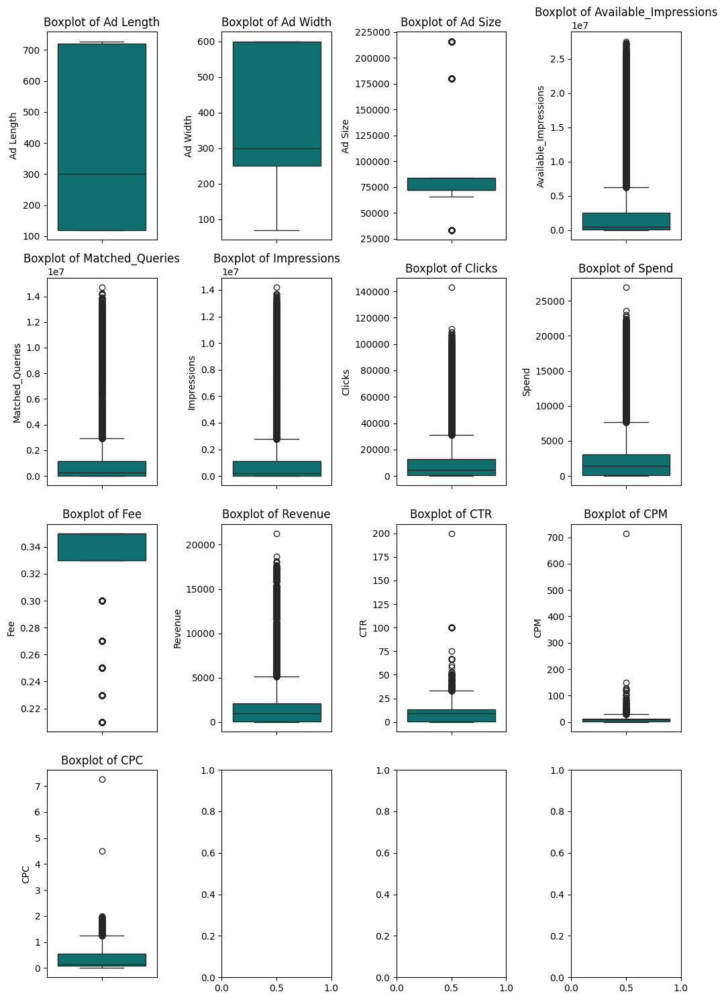

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10.5, 15));

# Check for outliers in numerical columns
for i, col in enumerate(numerical_cols1):
    sns.boxplot(df1[col],ax=axes[i//4, i%4],orient='v', color='teal');
    axes[i//4, i%4].set_title(f'Boxplot of {col}');
    axes[i//4, i%4].tick_params(axis='x', rotation=0)

plt.tight_layout();

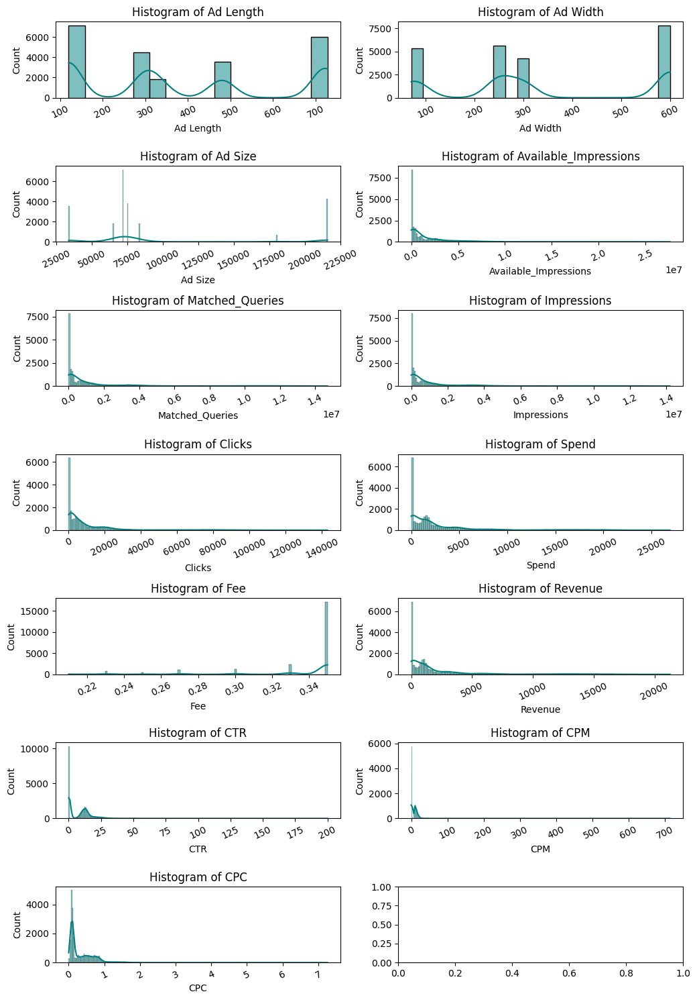

In [ ]:
# Histograms
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(10.5, 15));
for i, col in enumerate(numerical_cols1):
    sns.histplot(df1[col],ax=axes[i//2, i%2],kde=True, color='teal');
    axes[i//2, i%2].set_title(f'Histogram of {col}');
    axes[i//2, i%2].tick_params(axis='x', rotation=25)

plt.tight_layout();

In [ ]:
for col in categorical_cols1:
    print(df1[col].value_counts())
    print('\n------------------------------\n')

InventoryType
Format4    7165
Format5    4249
Format1    3814
Format3    3540
Format6    1850
Format2    1789
Format7     659
Name: count, dtype: int64

------------------------------

Ad Type
Inter224    1658
Inter217    1655
Inter223    1654
Inter219    1650
Inter221    1650
Inter222    1649
Inter229    1648
Inter227    1647
Inter218    1645
inter230    1644
Inter220    1644
Inter225    1643
Inter226    1640
Inter228    1639
Name: count, dtype: int64

------------------------------

Platform
Video    9873
Web      8251
App      4942
Name: count, dtype: int64

------------------------------

Device Type
Mobile     14806
Desktop     8260
Name: count, dtype: int64

------------------------------

Format
Video      11552
Display    11514
Name: count, dtype: int64

------------------------------



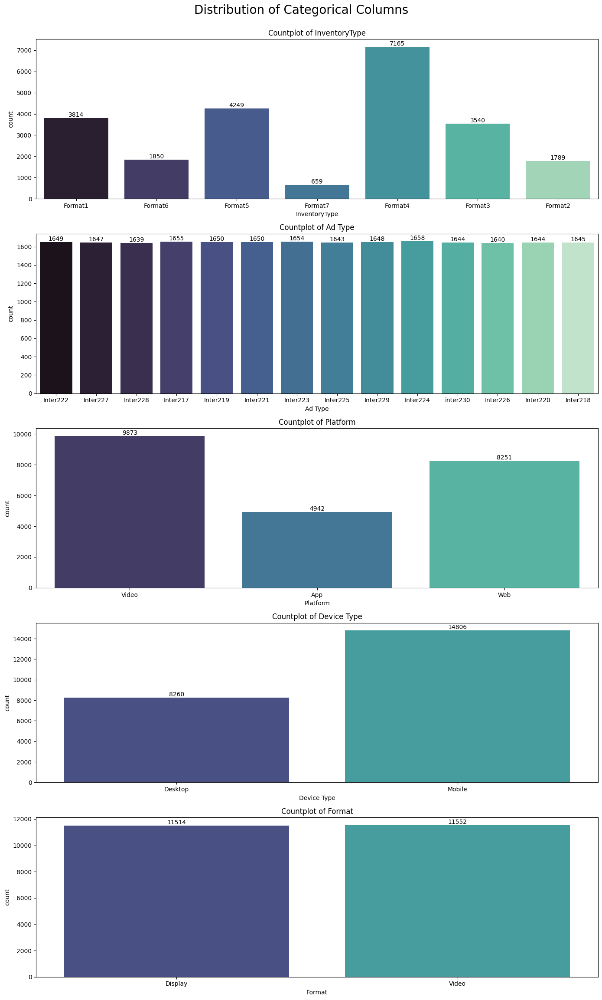

In [ ]:
# Distribution of Categorical columns
# Setting up the subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(14, 23))

plt.suptitle('Distribution of Categorical Columns', fontsize=20, y=1)

# Check for distribution of categorical columns
for i, col in enumerate(categorical_cols1):
    ax = axes[i]  # Use only one index
    sns.countplot(data=df1, x=col, ax=ax, palette='mako')
    ax.set_title(f'Countplot of {col}')
    ax.tick_params(axis='x')

    # Adding annotations
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.tight_layout()
plt.show()

### Bivariate Analysis

In [ ]:
corr_matrix = np.round(df1[numerical_cols1].corr(),2)
corr_matrix

,Ad Length,Ad Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
Ad Length,1.00,-0.71,0.54,0.30,0.30,0.29,-0.01,0.25,-0.14,0.25,-0.22,-0.23,0.25
Ad Width,-0.71,1.00,0.11,-0.41,-0.40,-0.40,0.16,-0.27,0.15,-0.26,0.62,0.55,-0.55
Ad Size,0.54,0.11,1.00,-0.20,-0.20,-0.20,0.12,-0.14,0.17,-0.14,0.34,0.25,-0.34
Available_Impressions,0.30,-0.41,-0.20,1.00,0.99,0.99,0.11,0.89,-0.81,0.90,-0.42,-0.35,0.56
Matched_Queries,0.30,-0.40,-0.20,0.99,1.00,1.00,0.12,0.90,-0.83,0.91,-0.42,-0.35,0.58
Impressions,0.29,-0.40,-0.20,0.99,1.00,1.00,0.11,0.90,-0.83,0.90,-0.42,-0.35,0.58
Clicks,-0.01,0.16,0.12,0.11,0.12,0.11,1.00,0.48,-0.53,0.47,0.10,0.13,-0.15
Spend,0.25,-0.27,-0.14,0.89,0.90,0.90,0.48,1.00,-0.96,1.00,-0.31,-0.23,0.48
Fee,-0.14,0.15,0.17,-0.81,-0.83,-0.83,-0.53,-0.96,1.00,-0.96,0.22,0.15,-0.40
Revenue,0.25,-0.26,-0.14,0.90,0.91,0.90,0.47,1.00,-0.96,1.00,-0.30,-0.22,0.47


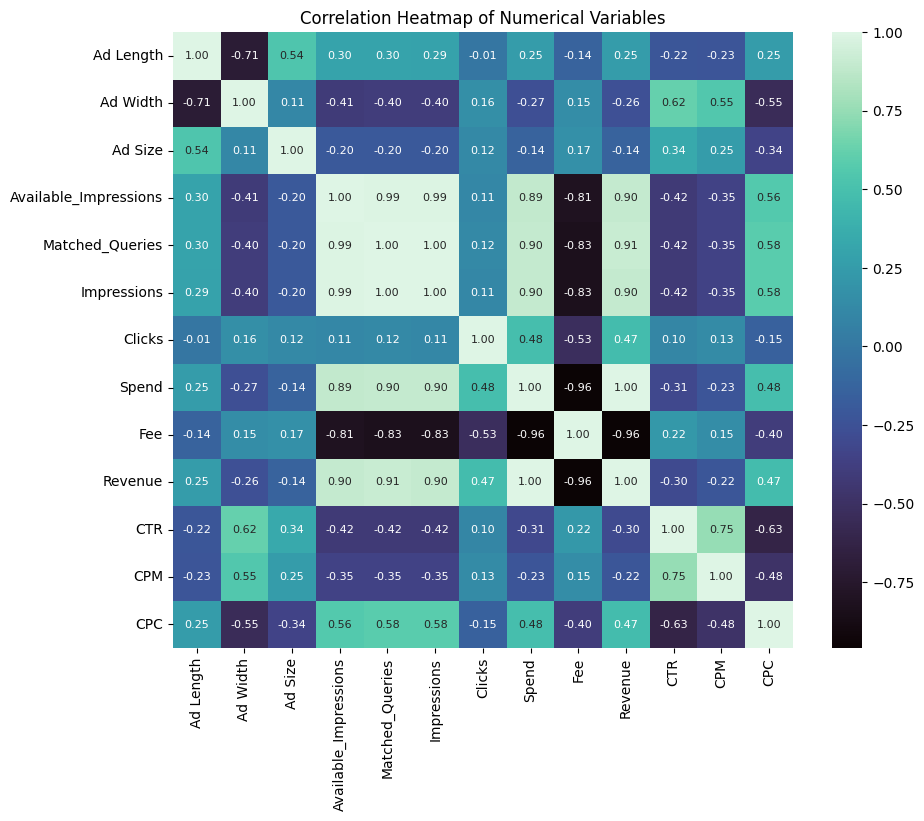

In [ ]:
# Correlation matrix for numerical variables
plt.figure(figsize=(10, 8));
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='mako',annot_kws={"size": 8});
plt.title('Correlation Heatmap of Numerical Variables');

In [ ]:
categorical_cols1

['InventoryType', 'Ad Type', 'Platform', 'Device Type', 'Format']

#### Inventory Type vs Numerical Columns

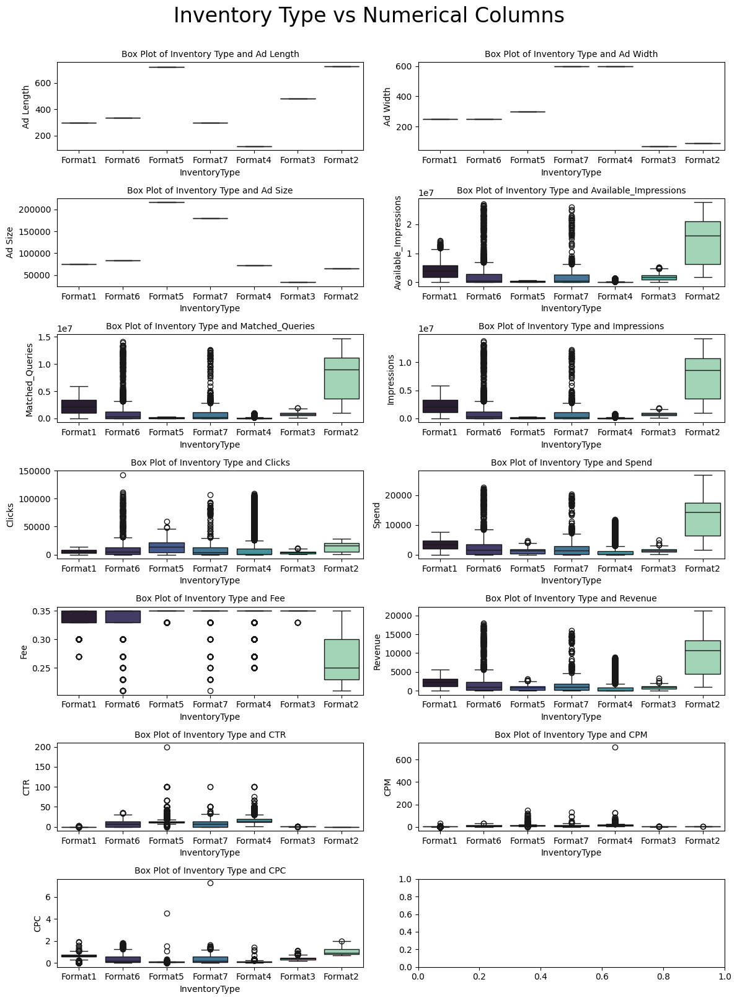

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(12, 16));

# Bivariate analysis: Gender vs Numerical variables
for i, num_col in enumerate(numerical_cols1):
    sns.boxplot(x='InventoryType', y=num_col, data=df1, palette='mako',ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Box Plot of Inventory Type and {num_col}',fontsize=10)
    # axes[i//3, i%3].tick_params(axis='x', rotation=35)
fig.suptitle('Inventory Type vs Numerical Columns', fontsize=24,y=1.005);
plt.tight_layout();

#### Ad Type vs Numerical Columns

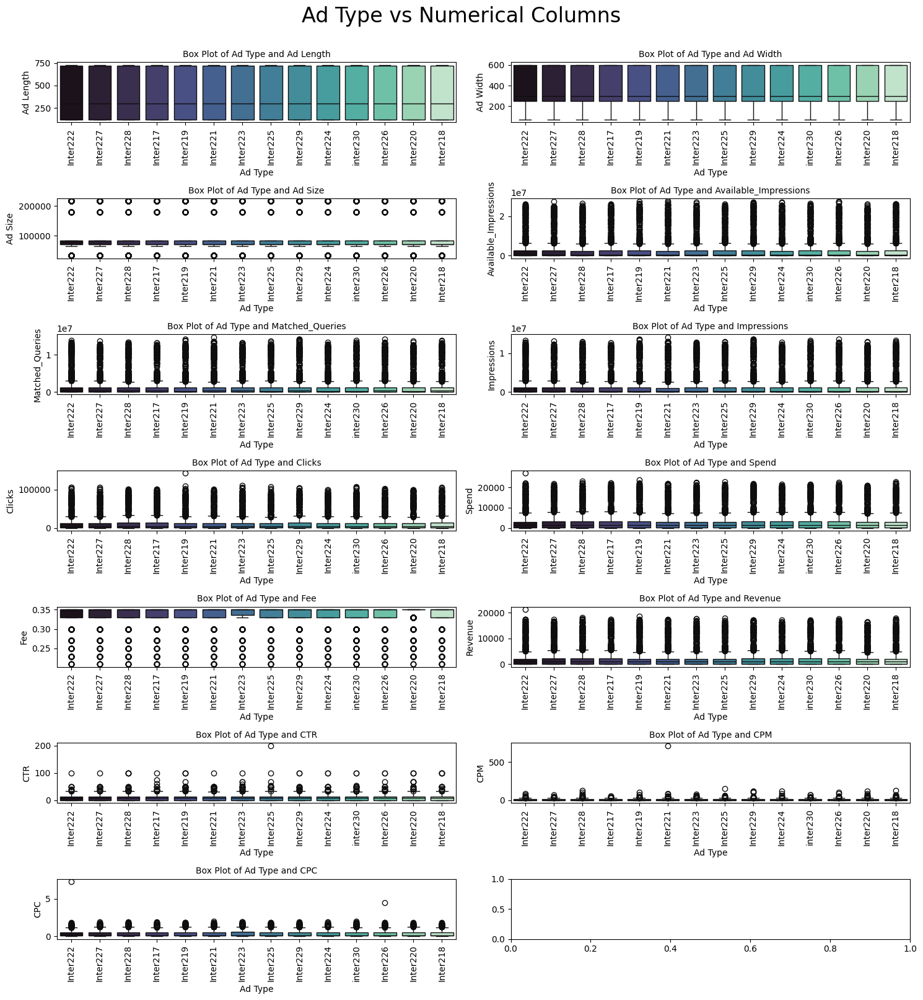

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(15, 16));

# Bivariate analysis: Gender vs Numerical variables
for i, num_col in enumerate(numerical_cols1):
    sns.boxplot(x='Ad Type', y=num_col, data=df1, palette='mako',ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Box Plot of Ad Type and {num_col}',fontsize=10)
    axes[i//2, i%2].tick_params(axis='x', rotation=90)
fig.suptitle('Ad Type vs Numerical Columns', fontsize=24,y=1.005);
plt.tight_layout();

#### Platform vs Numerical Columns

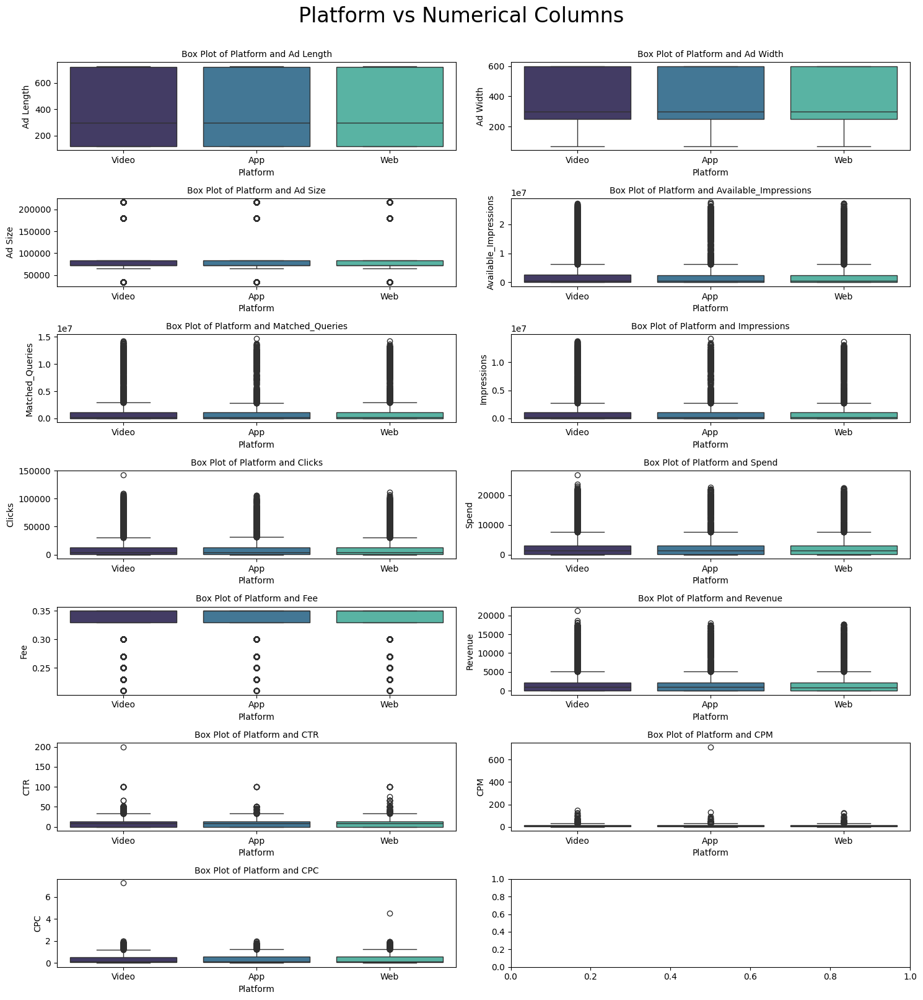

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(15, 16));

# Bivariate analysis: Gender vs Numerical variables
for i, num_col in enumerate(numerical_cols1):
    sns.boxplot(x='Platform', y=num_col, data=df1, palette='mako',ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Box Plot of Platform and {num_col}',fontsize=10)
    # axes[i//2, i%2].tick_params(axis='x', rotation=90)
fig.suptitle('Platform vs Numerical Columns', fontsize=24,y=1.005);
plt.tight_layout();

#### Device Type vs Numerical Columns

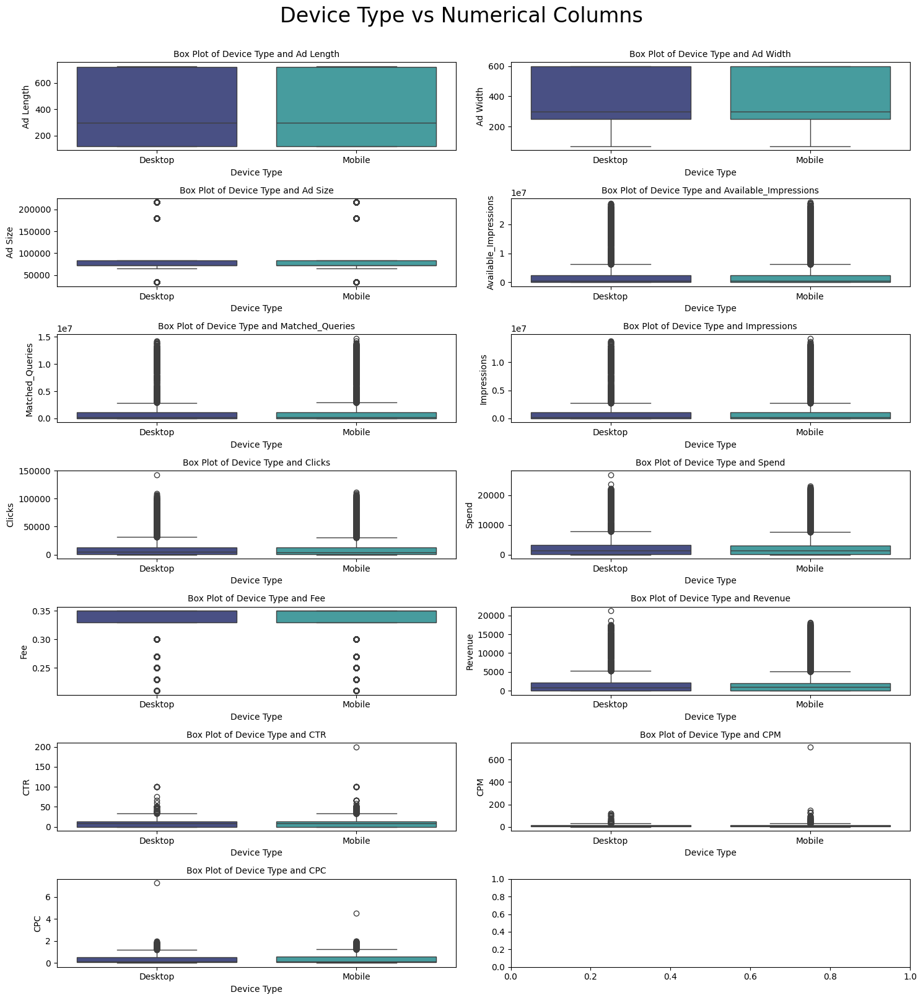

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(15, 16));

# Bivariate analysis: Gender vs Numerical variables
for i, num_col in enumerate(numerical_cols1):
    sns.boxplot(x='Device Type', y=num_col, data=df1, palette='mako',ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Box Plot of Device Type and {num_col}',fontsize=10)
    # axes[i//2, i%2].tick_params(axis='x', rotation=90)
fig.suptitle('Device Type vs Numerical Columns', fontsize=24,y=1.005);
plt.tight_layout();

#### Format vs Numerical Columns

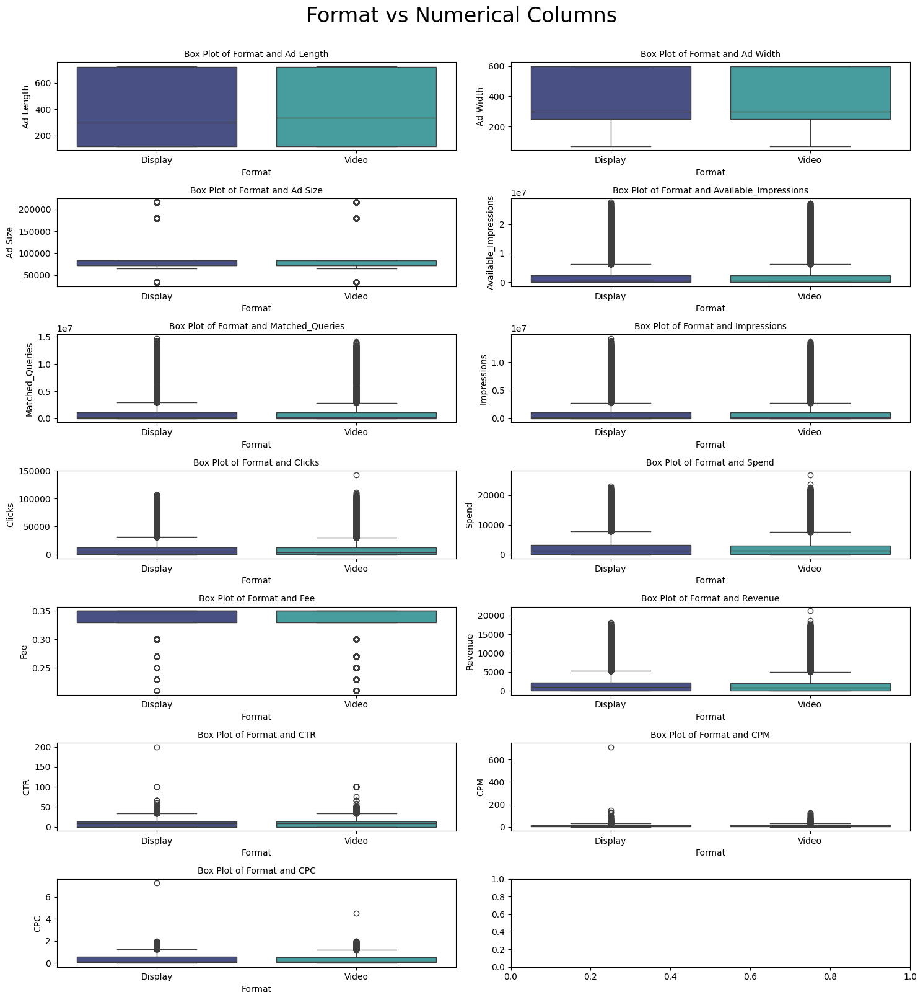

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(15, 16));

# Bivariate analysis: Gender vs Numerical variables
for i, num_col in enumerate(numerical_cols1):
    sns.boxplot(x='Format', y=num_col, data=df1, palette='mako',ax=axes[i//2, i%2])
    axes[i//2, i%2].set_title(f'Box Plot of Format and {num_col}',fontsize=10)
    # axes[i//2, i%2].tick_params(axis='x', rotation=90)
fig.suptitle('Format vs Numerical Columns', fontsize=24,y=1.005);
plt.tight_layout();

### Problem 1 - Data Preprocessing
- Missing value check and treatment - Outlier Treatment - z-score scaling Note: Treat missing values in CPC, CTR and CPM using the formula given.

In [ ]:
df1.isnull().sum()

InventoryType            0
Ad Length                0
Ad Width                 0
Ad Size                  0
Ad Type                  0
Platform                 0
Device Type              0
Format                   0
Available_Impressions    0
Matched_Queries          0
Impressions              0
Clicks                   0
Spend                    0
Fee                      0
Revenue                  0
CTR                      0
CPM                      0
CPC                      0
dtype: int64

#### We have already treated the missing value with the formula provided. So in the above we do not have missing values.
#### As the distance based techniques are very sensitive to outliers, it is necessary to treat outliers before feeding the data to the model. So, Here we are going to do the outlier treatment.
#### Before treating outliers, we will drop the columns which are not necessary for our problem

In [ ]:
df1.columns

Index(['InventoryType', 'Ad Length', 'Ad Width', 'Ad Size', 'Ad Type',
       'Platform', 'Device Type', 'Format', 'Available_Impressions',
       'Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue',
       'CTR', 'CPM', 'CPC'],
      dtype='object')

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23066 entries, 0 to 23065
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   InventoryType          23066 non-null  object 
 1   Ad Length              23066 non-null  int64  
 2   Ad Width               23066 non-null  int64  
 3   Ad Size                23066 non-null  int64  
 4   Ad Type                23066 non-null  object 
 5   Platform               23066 non-null  object 
 6   Device Type            23066 non-null  object 
 7   Format                 23066 non-null  object 
 8   Available_Impressions  23066 non-null  int64  
 9   Matched_Queries        23066 non-null  int64  
 10  Impressions            23066 non-null  int64  
 11  Clicks                 23066 non-null  int64  
 12  Spend                  23066 non-null  float64
 13  Fee                    23066 non-null  float64
 14  Revenue                23066 non-null  float64
 15  CT

#### We will remove the Object variables from the dataframe as these are not required for our problem.

In [ ]:
df1 = df1.drop(['InventoryType', 'Ad Type', 'Platform', 'Device Type', 'Format'], axis=1)
data_cluster = df1
# df1 = df1.drop(['CTR', 'CPM', 'CPC'], axis=1)
df1.head()

,Ad Length,Ad Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,300,250,75000,1806,325,323,1,0.0,0.35,0.0,0.31,0.0,0.0
1,300,250,75000,1780,285,285,1,0.0,0.35,0.0,0.35,0.0,0.0
2,300,250,75000,2727,356,355,1,0.0,0.35,0.0,0.28,0.0,0.0
3,300,250,75000,2430,497,495,1,0.0,0.35,0.0,0.20,0.0,0.0
4,300,250,75000,1218,242,242,1,0.0,0.35,0.0,0.41,0.0,0.0


In [ ]:
num_col_new = df1.columns
num_col_new

Index(['Ad Length', 'Ad Width', 'Ad Size', 'Available_Impressions',
       'Matched_Queries', 'Impressions', 'Clicks', 'Spend', 'Fee', 'Revenue',
       'CTR', 'CPM', 'CPC'],
      dtype='object')

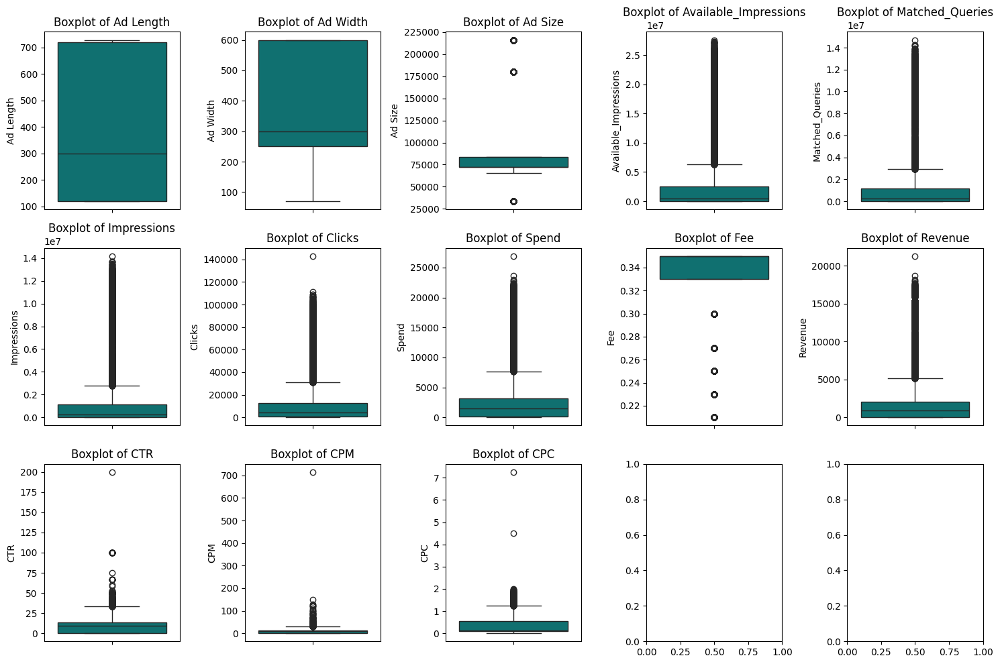

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10));

# Check for outliers in numerical columns
for i, col in enumerate(num_col_new):
    sns.boxplot(df1[col],ax=axes[i//5, i%5],orient='v', color='teal');
    axes[i//5, i%5].set_title(f'Boxplot of {col}');
    axes[i//5, i%5].tick_params(axis='x', rotation=0)

plt.tight_layout();

In [ ]:
def handle_outliers(data, columns):
    for col in columns:
        # Calculate the quartiles
        Q1 = np.percentile(data[col].values, 25)
        Q3 = np.percentile(data[col].values, 75)

        # Calculate the interquartile range (IQR)
        IQR = Q3 - Q1

        # Calculate the lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Replace outliers with lower or upper bound values
        data.loc[data[col] < lower_bound, col] = lower_bound
        data.loc[data[col] > upper_bound, col] = upper_bound

    return data

In [ ]:
df1 = handle_outliers(df1, num_col_new)

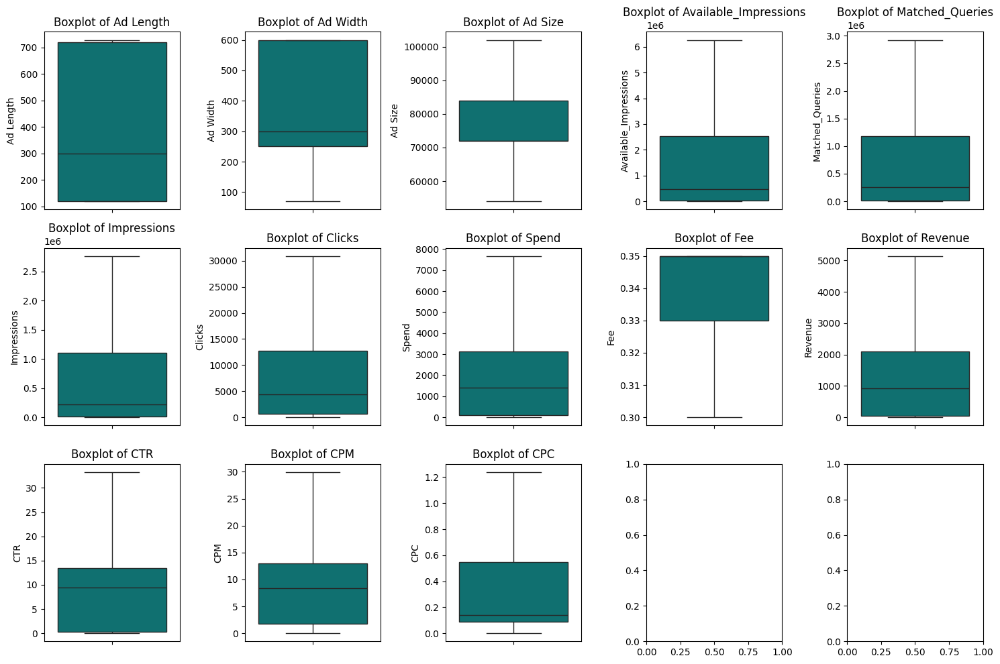

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10));

# Check for outliers in numerical columns
for i, col in enumerate(num_col_new):
    sns.boxplot(df1[col],ax=axes[i//5, i%5],orient='v', color='teal');
    axes[i//5, i%5].set_title(f'Boxplot of {col}');
    axes[i//5, i%5].tick_params(axis='x', rotation=0)

plt.tight_layout();

#### From the above we can see that we have treated the outliers in the numerical columns. Now we will proceed with scaling our data.

In [ ]:
np.round(df1.describe().T,2)

,count,mean,std,min,25%,50%,75%,max
Ad Length,23066.0,385.16,233.65,120.00,120.00,300.00,720.00,728.00
Ad Width,23066.0,337.90,203.09,70.00,250.00,300.00,600.00,600.00
Ad Size,23066.0,76576.84,15381.32,54000.00,72000.00,72000.00,84000.00,102000.00
Available_Impressions,23066.0,1607252.77,2125527.93,1.00,33672.25,483771.00,2527711.75,6268771.00
Matched_Queries,23066.0,799538.04,1026036.79,1.00,18282.50,258087.50,1180700.00,2924326.25
Impressions,23066.0,753611.99,980256.81,1.00,7990.50,225290.00,1112428.50,2769085.50
Clicks,23066.0,8306.83,9574.78,1.00,710.00,4425.00,12793.75,30919.38
Spend,23066.0,2166.06,2425.19,0.00,85.18,1425.12,3121.40,7675.73
Fee,23066.0,0.34,0.02,0.30,0.33,0.35,0.35,0.35
Revenue,23066.0,1449.39,1646.89,0.00,55.37,926.34,2091.34,5145.30


#### Data Scaling

In [ ]:
scaler1 = StandardScaler()
df1_scaled = scaler1.fit_transform(df1)
df1_scaled = pd.DataFrame(df1_scaled, columns=df1.columns)

In [ ]:
df1_scaled.head()

,Ad Length,Ad Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC
0,-0.364496,-0.432797,-0.102518,-0.755333,-0.778949,-0.768478,-0.867488,-0.89317,0.535724,-0.880093,-0.958813,-1.194521,-1.041011
1,-0.364496,-0.432797,-0.102518,-0.755345,-0.778988,-0.768516,-0.867488,-0.89317,0.535724,-0.880093,-0.953966,-1.194521,-1.041011
2,-0.364496,-0.432797,-0.102518,-0.754900,-0.778919,-0.768445,-0.867488,-0.89317,0.535724,-0.880093,-0.962448,-1.194521,-1.041011
3,-0.364496,-0.432797,-0.102518,-0.755040,-0.778781,-0.768302,-0.867488,-0.89317,0.535724,-0.880093,-0.972141,-1.194521,-1.041011
4,-0.364496,-0.432797,-0.102518,-0.755610,-0.779030,-0.768560,-0.867488,-0.89317,0.535724,-0.880093,-0.946696,-1.194521,-1.041011


##### Z-score scaling ensures equal contribution of all features to distance calculations in both K-means and hierarchical clustering algorithms.
##### It facilitates faster convergence by stabilizing the optimization process, leading to reduced computational time.
##### Clustering algorithms become more robust to variations in feature scales across datasets, promoting scalability and generalizability.

### Problem 1 - Hierarchical Clustering
- Construct a dendrogram using Ward linkage and Euclidean distance - Identify the optimum number of Clusters

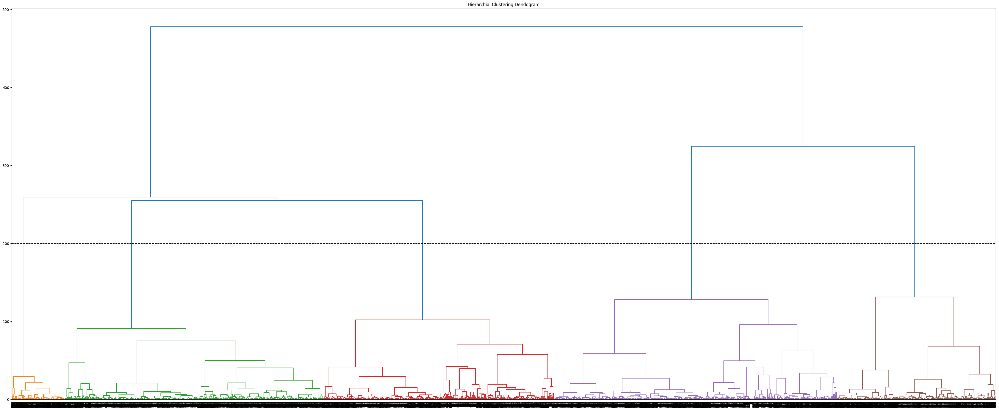

In [ ]:
plt.figure(figsize=(50, 20))
plt.title("Hierarchial Clustering Dendogram")
dend = shc.dendrogram(shc.linkage(df1_scaled, method='ward'),color_threshold=200)
plt.axhline(200, color='black', linestyle='--')
plt.show()

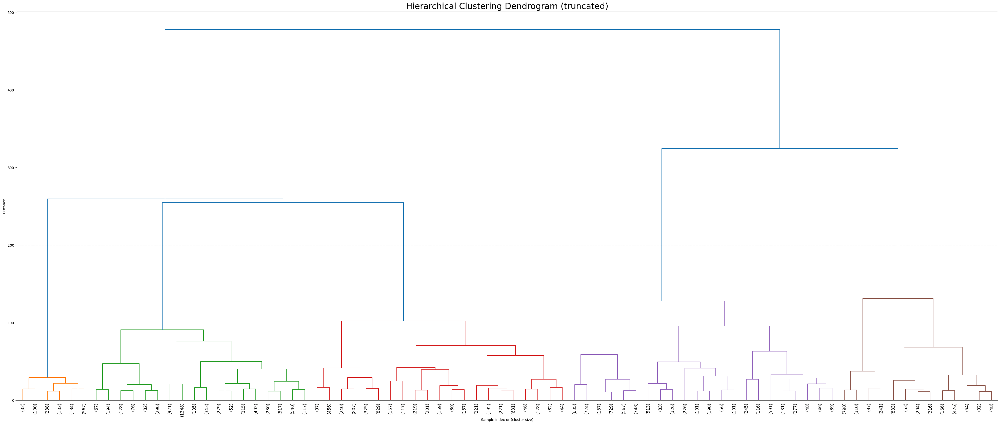

In [ ]:
plt.figure(figsize=(50, 20))
Z_Final = linkage(df1_scaled, 'ward', metric='euclidean')
plt.title('Hierarchical Clustering Dendrogram (truncated)', fontsize=24)
plt.xlabel('Sample index or (cluster size)')
plt.ylabel('Distance')
dendrogram(
    Z_Final,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=80,  # show only the last p merged clusters
    leaf_rotation=90,
    leaf_font_size=12,
    color_threshold=200
)
plt.axhline(200, color='black', linestyle='--')
plt.show()

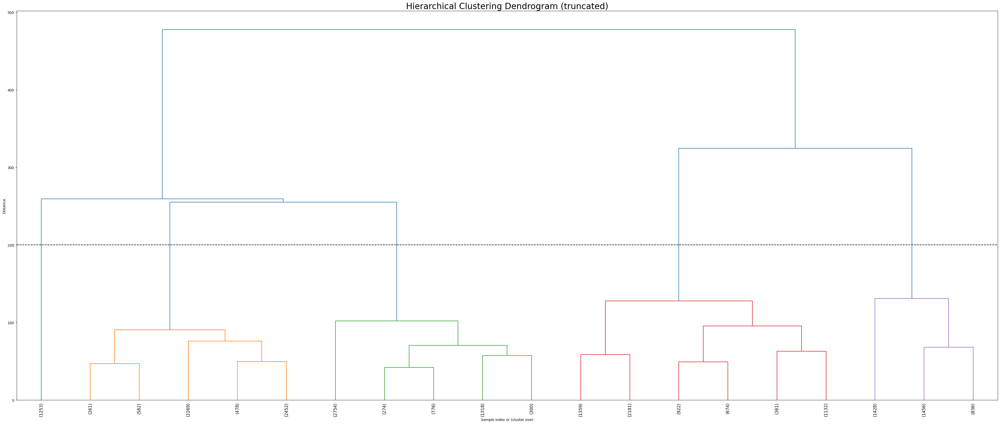

In [ ]:
plt.figure(figsize=(50, 20))
Z_Final = linkage(df1_scaled, 'ward', metric='euclidean')
plt.title('Hierarchical Clustering Dendrogram (truncated)', fontsize=24)
plt.xlabel('Sample index or (cluster size)')
plt.ylabel('Distance')
dendrogram(
    Z_Final,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=20,  # show only the last p merged clusters
    leaf_rotation=90,
    leaf_font_size=12,
    color_threshold=200
)
plt.axhline(200, color='black', linestyle='--')
plt.show()

#### We choose optimum number of clusters as 5

In [ ]:
clusters_1 = shc.fcluster(shc.linkage(df1_scaled, method='ward'), 5, criterion='maxclust')# Here 5 is number of clusters we want
clusters_1

array([4, 4, 4, ..., 3, 2, 3], dtype=int32)

In [ ]:
clusters_2 = shc.fcluster(shc.linkage(df1_scaled, method='ward'),200 , criterion='distance')# here 200 is the value of color_threshold in the dendrogram
clusters_2

array([4, 4, 4, ..., 3, 2, 3], dtype=int32)

In [ ]:
data_cluster['Hierarchial']= clusters_1
data_cluster.head()

,Ad Length,Ad Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,Hierarchial
0,300,250,75000,1806,325.0,323.0,1.0,0.0,0.35,0.0,0.31,0.0,0.0,4
1,300,250,75000,1780,285.0,285.0,1.0,0.0,0.35,0.0,0.35,0.0,0.0,4
2,300,250,75000,2727,356.0,355.0,1.0,0.0,0.35,0.0,0.28,0.0,0.0,4
3,300,250,75000,2430,497.0,495.0,1.0,0.0,0.35,0.0,0.20,0.0,0.0,4
4,300,250,75000,1218,242.0,242.0,1.0,0.0,0.35,0.0,0.41,0.0,0.0,4


In [ ]:
df_clust_1 = np.round(data_cluster.groupby('Hierarchial').mean(),2)
cluster_1_freq = data_cluster['Hierarchial'].value_counts().sort_index()
df_clust_1['Hierarchial Cluster Count'] = cluster_1_freq
df_clust_1

,Ad Length,Ad Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,Hierarchial Cluster Count
Hierarchial,,,,,,,,,,,,,,
1,141.84,572.07,73723.86,878728.68,620739.08,523812.01,30914.45,7101.20,0.30,4863.03,13.77,15.22,0.11,1253
2,120.03,599.94,72000.50,50769.36,32793.57,24640.63,3148.26,384.11,0.35,253.18,15.88,14.53,0.10,6042
3,634.60,309.68,99151.60,221898.59,121823.02,102920.61,12495.59,1116.35,0.35,727.37,13.47,12.01,0.09,5422
4,422.58,158.81,65079.16,1917087.39,932487.73,892409.73,3326.81,1621.84,0.35,1060.82,0.39,1.79,0.55,6629
5,467.51,193.66,72556.06,5847739.37,2855976.87,2716069.72,11839.57,5897.78,0.31,3987.23,0.22,1.55,0.74,3720


### Problem 1 - K-means Clustering
- Apply K-means Clustering - Plot the Elbow curve - Check Silhouette Scores - Figure out the appropriate number of clusters - Cluster Profiling

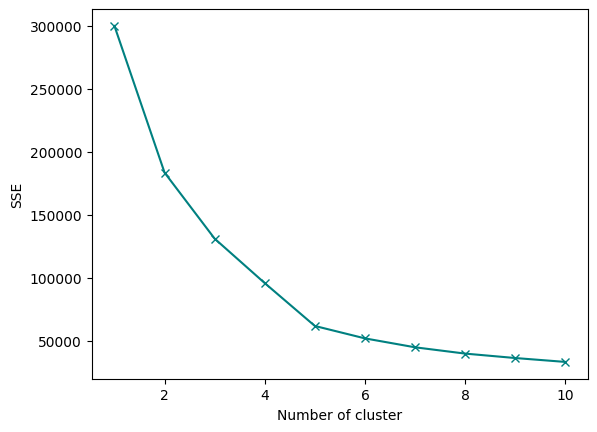

In [ ]:
#Empty dictionary to store the SSE for each value of k
sse = {}

# iterate for a range of Ks and fit the scaled data to the algorithm. Use inertia attribute from the clustering object and
# store the inertia value for that k
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(df1_scaled)
    sse[k] = kmeans.inertia_

#Elbow plot
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), 'bx-', color='teal')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

0.38563243892114524
0.38243884204768586
0.4531726434339728
0.5240366992240224
0.5220833406497346
0.516533630882499
0.47970312220599165
0.43674598228715067
0.44063670453827736


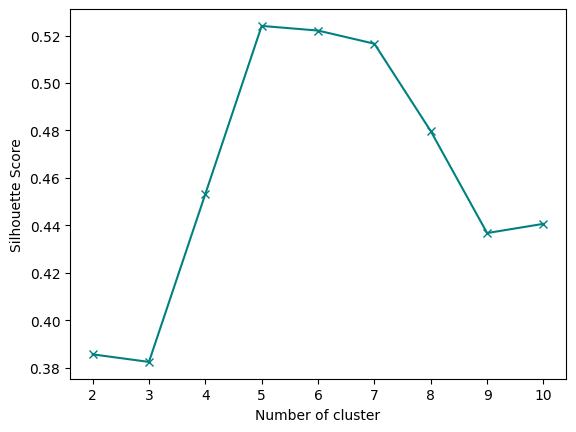

In [ ]:
#Empty dictionary to store the Silhouette score for each value of k
sc = {}

# iterate for a range of Ks and fit the scaled data to the algorithm. Store the Silhouette score for that k
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(df1_scaled)
    labels = kmeans.predict(df1_scaled)
    sc[k] = silhouette_score(df1_scaled, labels)
    print(sc[k])

#Elbow plot
plt.figure()
plt.plot(list(sc.keys()), list(sc.values()), 'bx-', color='teal')
plt.xlabel("Number of cluster")
plt.ylabel("Silhouette Score")
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=1)
kmeans.fit(df1_scaled)

#Adding predicted labels to the original data
data_cluster['KMeans'] = kmeans.predict(df1_scaled)

In [ ]:
data_cluster['KMeans'].value_counts()

KMeans
2    6524
0    6277
4    4674
1    4054
3    1537
Name: count, dtype: int64

### Cluster Profiling

In [ ]:
data_cluster.head()

,Ad Length,Ad Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,Hierarchial,KMeans
0,300,250,75000,1806,325.0,323.0,1.0,0.0,0.35,0.0,0.31,0.0,0.0,4,0
1,300,250,75000,1780,285.0,285.0,1.0,0.0,0.35,0.0,0.35,0.0,0.0,4,0
2,300,250,75000,2727,356.0,355.0,1.0,0.0,0.35,0.0,0.28,0.0,0.0,4,0
3,300,250,75000,2430,497.0,495.0,1.0,0.0,0.35,0.0,0.20,0.0,0.0,4,0
4,300,250,75000,1218,242.0,242.0,1.0,0.0,0.35,0.0,0.41,0.0,0.0,4,0


In [ ]:
clust_profile=data_cluster.groupby('KMeans').mean()
clust_profile['KMeans Cluster Count']=data_cluster['KMeans'].value_counts().sort_index()
clust_profile

,Ad Length,Ad Width,Ad Size,Available_Impressions,Matched_Queries,Impressions,Clicks,Spend,Fee,Revenue,CTR,CPM,CPC,Hierarchial,KMeans Cluster Count
KMeans,,,,,,,,,,,,,,,
0,421.657480,152.144336,64312.008921,1.810356e+06,8.642419e+05,8.261961e+05,3263.804365,1500.062227,0.349264,977.404991,0.404529,1.788804,0.528440,4.007647,6277
1,465.781944,199.148989,72963.936852,5.695405e+06,2.806219e+06,2.671268e+06,11245.754810,5739.327617,0.313281,3878.748366,0.217218,1.573217,0.749302,4.905772,4054
2,143.280809,572.103004,73966.738197,3.209356e+04,1.962406e+04,1.349204e+04,1914.448804,209.162609,0.349988,135.993379,15.784252,14.329909,0.102727,2.115573,6524
3,141.454782,572.446324,73686.402082,8.063284e+05,5.668641e+05,4.781485e+05,30572.439330,6546.373195,0.305569,4471.776116,13.752622,15.385719,0.111900,1.202342,1537
4,683.989730,303.658537,100775.353017,2.506232e+05,1.372674e+05,1.165011e+05,14131.023936,1252.217587,0.349538,815.498308,13.294842,11.732960,0.089893,3.000642,4674


In [ ]:
#Calculating mean and median of the original data for each label
mean = np.round(data_cluster.groupby('KMeans').mean(),2)
median = np.round(data_cluster.groupby('KMeans').median(),2)
df_kmeans = pd.concat([mean, median], axis=0)
df_kmeans.index = ['Cluster_0 Mean', 'Cluster_1 Mean', 'Cluster_2 Mean', 'Cluster_3 Mean', 'Cluster_4 Mean',
                   'Cluster_0 Median', 'Cluster_1 Median', 'Cluster_2 Median', 'Cluster_3 Median', 'Cluster_4 Median']
df_kmeans_transposed = df_kmeans.T
df_kmeans_transposed = df_kmeans_transposed.drop('Hierarchial')
df_kmeans_transposed

,Cluster_0 Mean,Cluster_1 Mean,Cluster_2 Mean,Cluster_3 Mean,Cluster_4 Mean,Cluster_0 Median,Cluster_1 Median,Cluster_2 Median,Cluster_3 Median,Cluster_4 Median
Ad Length,421.66,465.78,143.28,141.45,683.99,480.00,300.00,120.00,120.00,720.00
Ad Width,152.14,199.15,572.10,572.45,303.66,70.00,250.00,600.00,600.00,300.00
Ad Size,64312.01,72963.94,73966.74,73686.40,100775.35,54000.00,75000.00,72000.00,72000.00,102000.00
Available_Impressions,1810355.96,5695404.59,32093.56,806328.42,250623.18,1833902.00,6268771.00,13920.50,831024.00,213533.50
Matched_Queries,864241.90,2806219.21,19624.06,566864.05,137267.40,861001.00,2924326.25,8263.50,583232.00,137245.50
Impressions,826196.15,2671267.53,13492.04,478148.52,116501.06,815606.00,2769085.50,3631.50,490310.00,115808.50
Clicks,3263.80,11245.75,1914.45,30572.44,14131.02,3255.00,8928.50,454.00,30919.38,14729.00
Spend,1500.06,5739.33,209.16,6546.37,1252.22,1548.63,5229.23,47.46,7172.60,1336.86
Fee,0.35,0.31,0.35,0.31,0.35,0.35,0.30,0.35,0.30,0.35
Revenue,977.40,3878.75,135.99,4471.78,815.50,1006.61,3660.46,30.85,5145.30,868.96


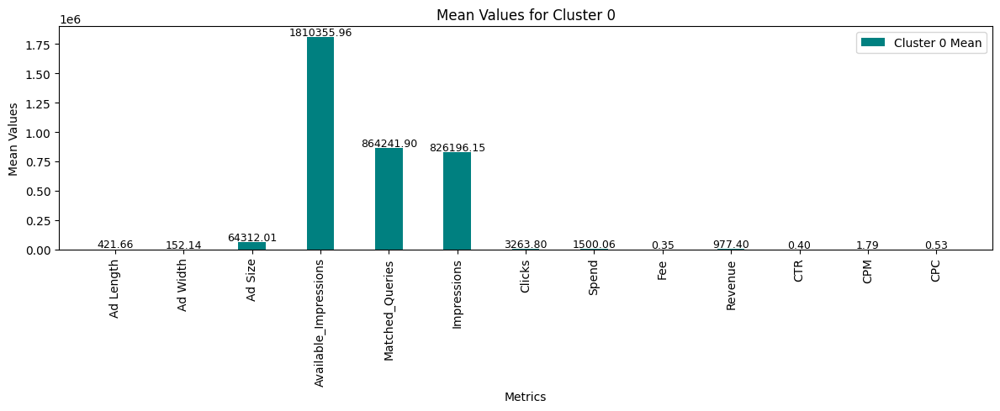

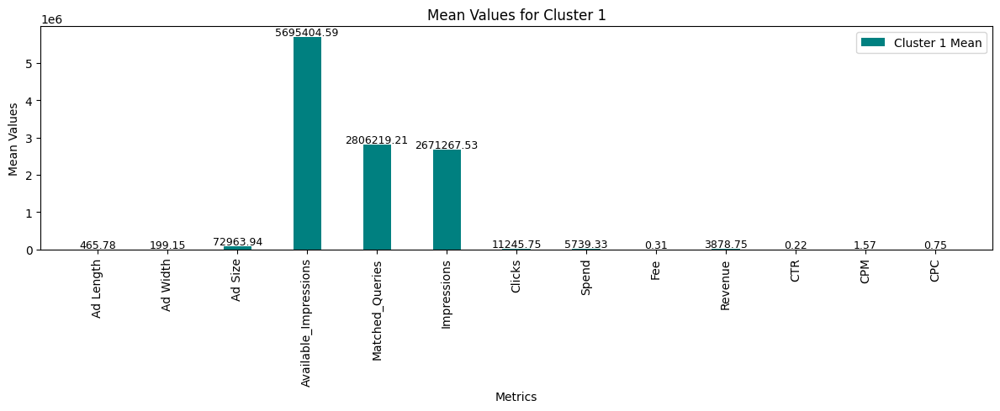

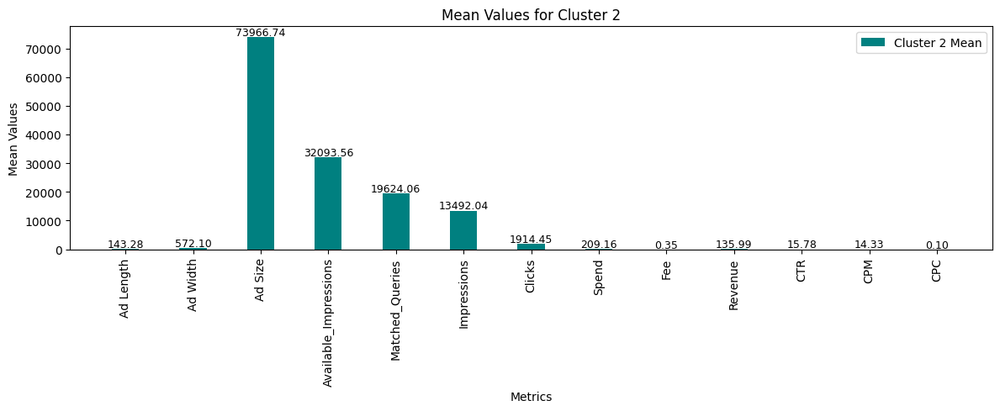

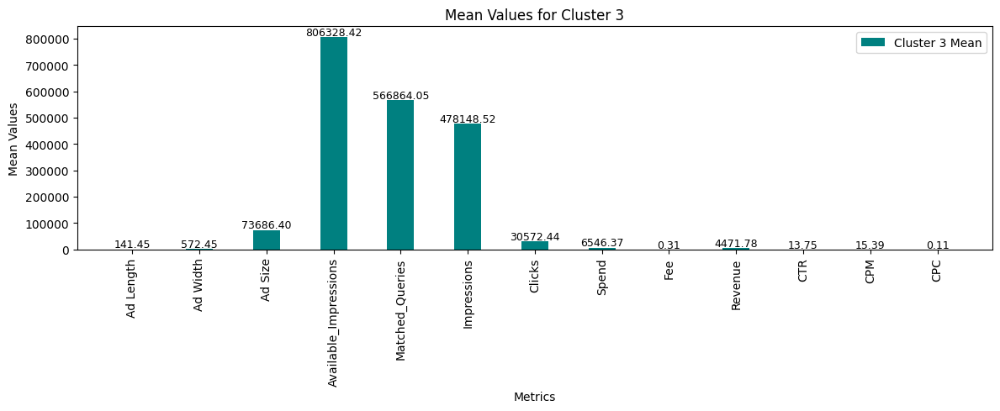

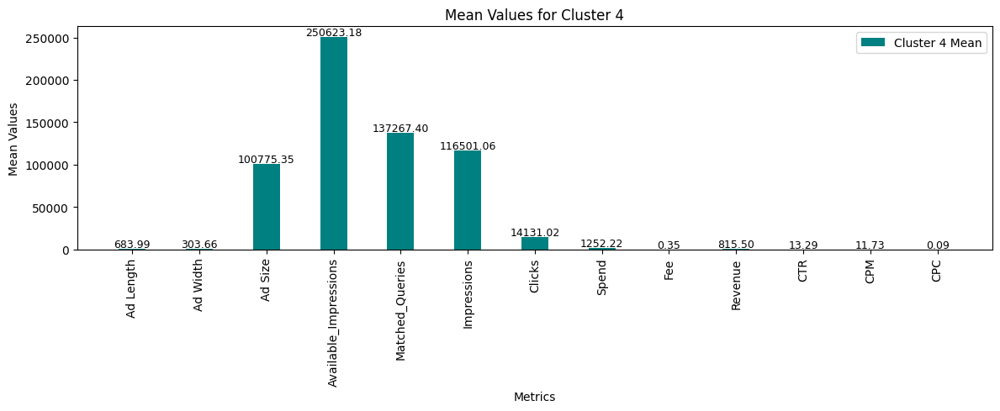

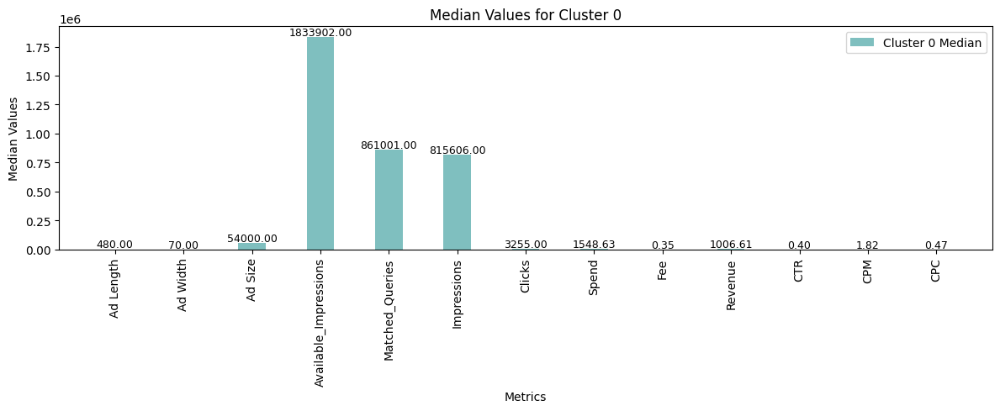

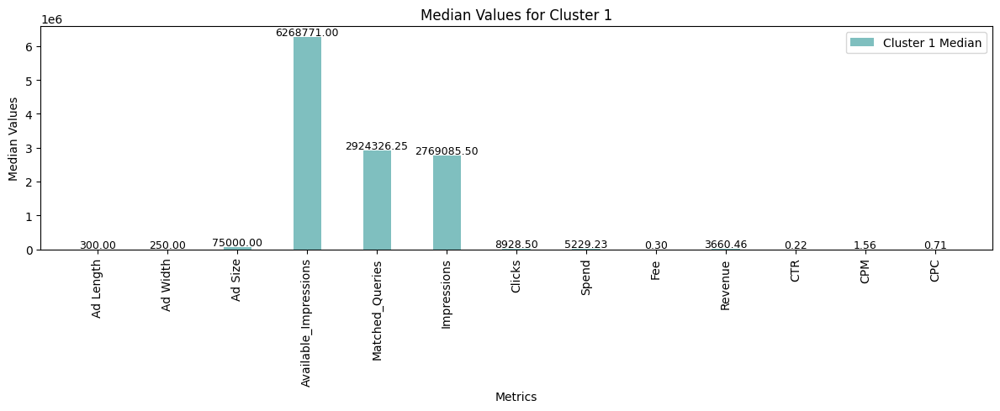

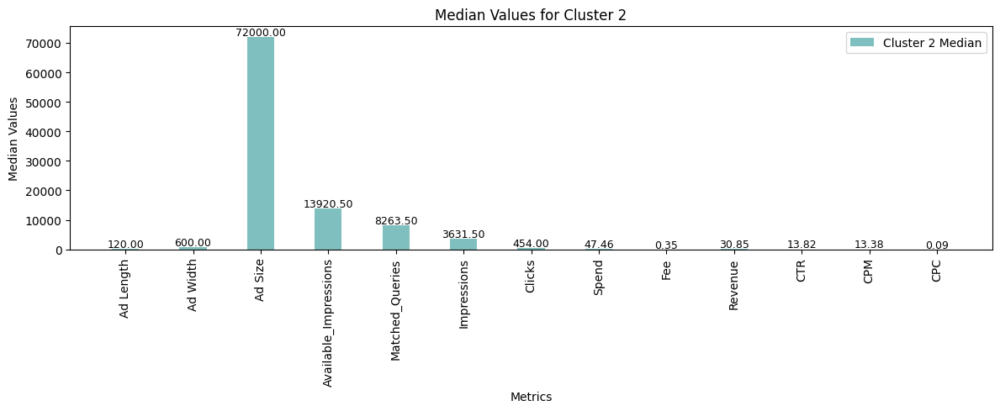

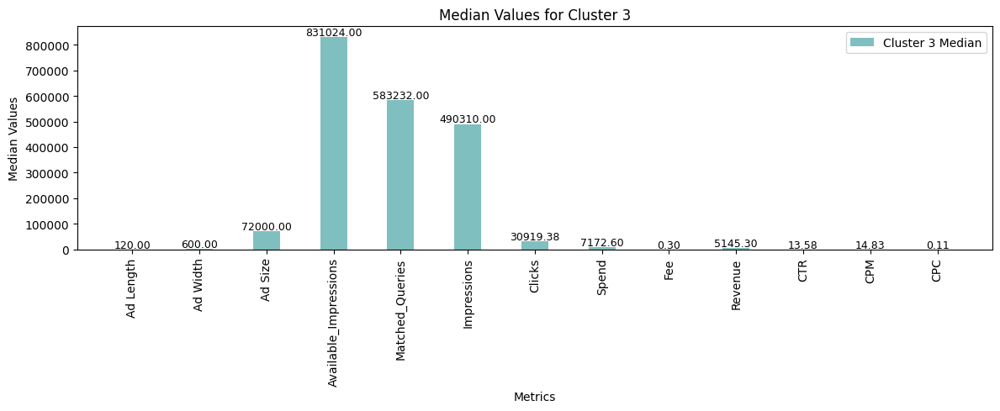

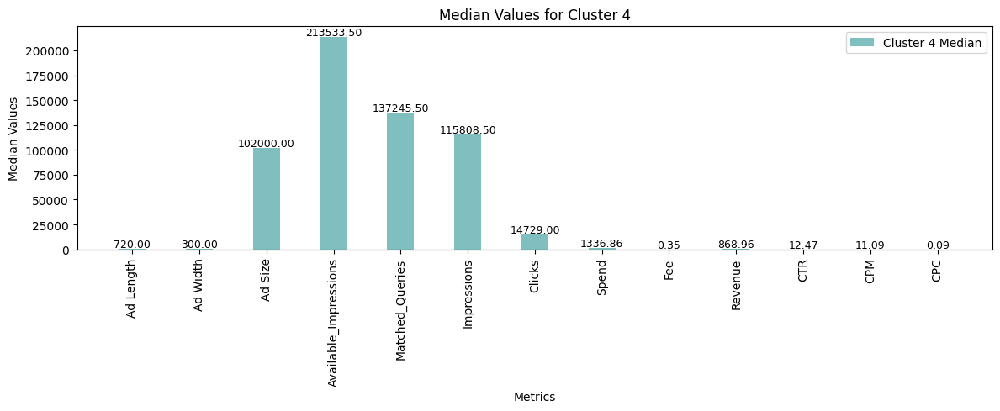

In [ ]:
# Function to annotate bars with values
def annotate_bars(ax):
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=9, color='black', xytext=(0, 4),
                    textcoords='offset points')

# Plotting mean values for each Cluster
for i in range(5):
    plt.figure(figsize=(12, 5))
    ax = plt.bar(df_kmeans_transposed.index, df_kmeans_transposed[f'Cluster_{i} Mean'], width=0.4, label=f'Cluster {i} Mean', align='center', color='teal')
    plt.xlabel('Metrics')
    plt.ylabel('Mean Values')
    plt.title(f'Mean Values for Cluster {i}')
    plt.xticks(rotation=90)  # Rotate x-axis labels to 90 degrees
    plt.legend()
    annotate_bars(plt.gca())  # Annotate bars with values
    plt.tight_layout()
    plt.show()

# Plotting median values for each Cluster
for i in range(5):
    plt.figure(figsize=(12, 5))
    ax = plt.bar(df_kmeans_transposed.index, df_kmeans_transposed[f'Cluster_{i} Median'], width=0.4, label=f'Cluster {i} Median', align='center', alpha=0.5, color='teal')
    plt.xlabel('Metrics')
    plt.ylabel('Median Values')
    plt.title(f'Median Values for Cluster {i}')
    plt.xticks(rotation=90)  # Rotate x-axis labels to 90 degrees
    plt.legend()
    annotate_bars(plt.gca())  # Annotate bars with values
    plt.tight_layout()
    plt.show()

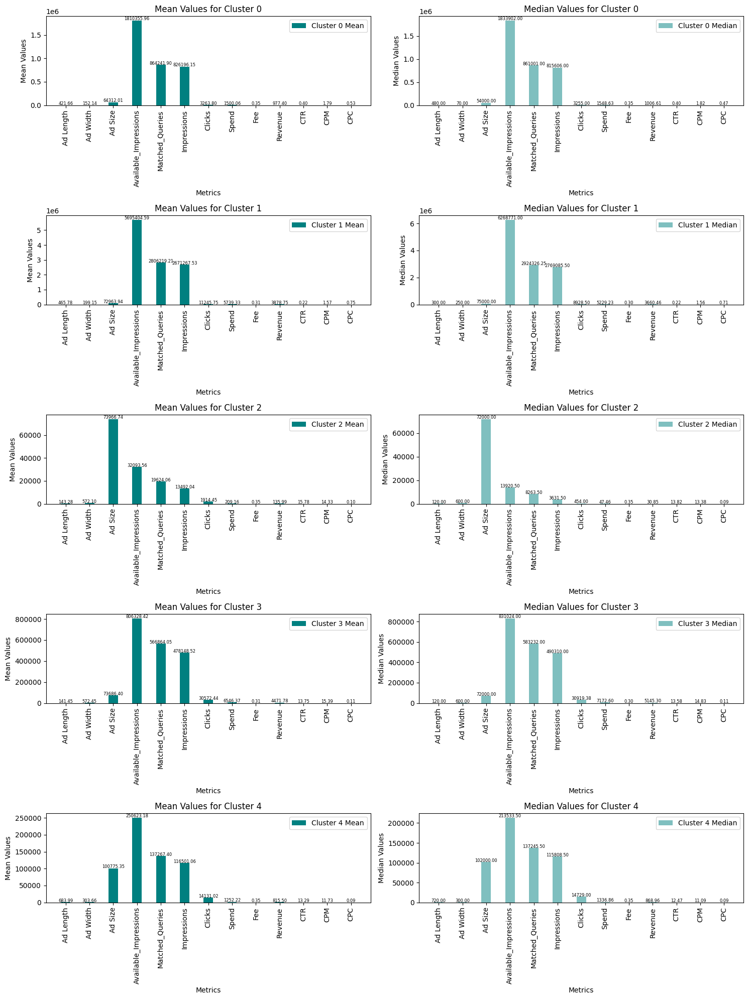

In [ ]:
# Function to annotate bars with values
def annotate_bars(ax):
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=6, color='black', xytext=(0, 2),
                    textcoords='offset points')

# Create subplots
fig, axs = plt.subplots(5, 2, figsize=(15, 20))

# Plotting mean and median values for each group
for i in range(5):  # Assuming there are 5 groups
    # Plot mean values
    axs[i, 0].bar(df_kmeans_transposed.index, df_kmeans_transposed[f'Cluster_{i} Mean'], width=0.4, label=f'Cluster {i} Mean', align='center', color='teal')
    axs[i, 0].set_xlabel('Metrics')
    axs[i, 0].set_ylabel('Mean Values')
    axs[i, 0].set_title(f'Mean Values for Cluster {i}')
    axs[i, 0].set_xticklabels(df_kmeans_transposed.index, rotation=90)  # Rotate x-axis labels to 90 degrees
    axs[i, 0].legend()
    annotate_bars(axs[i, 0])  # Annotate bars with values

    # Plot median values
    axs[i, 1].bar(df_kmeans_transposed.index, df_kmeans_transposed[f'Cluster_{i} Median'], width=0.4, label=f'Cluster {i} Median', align='center', alpha=0.5, color='teal')
    axs[i, 1].set_xlabel('Metrics')
    axs[i, 1].set_ylabel('Median Values')
    axs[i, 1].set_title(f'Median Values for Cluster {i}')
    axs[i, 1].set_xticklabels(df_kmeans_transposed.index, rotation=90)  # Rotate x-axis labels to 90 degrees
    axs[i, 1].legend()
    annotate_bars(axs[i, 1])  # Annotate bars with values

plt.tight_layout()

### Problem 1 - Actionable Insights & Recommendations
- Extract meaningful insights (atleast 3) from the clusters to identify the most effective types of ads, target audiences, or marketing strategies that can be inferred from each segment. - Based on the clustering analysis and key insights, provide actionable recommendations (atleast 3) to Ads24x7 on how to optimize their digital marketing efforts, allocate budgets efficiently, and tailor ad content to specific audience segments.

##### • There are 23066 rows, and 19 columns into the Dataset.
##### • There are no duplicate values in dataframe.
##### • There are 4636 Null values in CTR, CPM, and CPC Columns.
##### • I have treated missing values in CPC, CTR, and CPM columns using the given formula
##### • It seems that there are Outliers into the Dataset
##### • We treated outliers using upper and lower bound values
##### • I have applied z-score method on the dataframe for scaling
##### • I have plotted Dendrogram and got optimum number of clusters is 5
##### • Plotted elbow plot and got optimum value is 5
##### • As per Elbow plot/scree-plot, we concluded that the optimal number of clusters should be 5.
##### • I have created 5 clusters for the Dataset.

### Recommendations
##### • When Click on Ads gets increases then Revenue is also increases.
##### • When amount of money spent on specific ad variations within a specific campaign or ad set increases then Revenue is also increases.
##### • When impression count of the particular Advertisement increases then Revenue is also increases

## ***Problem 2 - PCA***

### Problem 2 - Define the problem and perform Exploratory Data Analysis
- Problem Definition - Check shape, Data types, statistical summary - Perform an EDA on the data to extract useful insights Note: 1. Pick 5 variables out of the given 24 variables below for EDA: No_HH, TOT_M, TOT_F, M_06, F_06, M_SC, F_SC, M_ST, F_ST, M_LIT, F_LIT, M_ILL, F_ILL, TOT_WORK_M, TOT_WORK_F, MAINWORK_M, MAINWORK_F, MAIN_CL_M, MAIN_CL_F, MAIN_AL_M, MAIN_AL_F, MAIN_HH_M, MAIN_HH_F, MAIN_OT_M, MAIN_OT_F 2. Example questions to answer from EDA - (i) Which state has highest gender ratio and which has the lowest? (ii) Which district has the highest & lowest gender ratio?

In [ ]:
#Read the Dataset

df2 = pd.read_excel('/content/Dataset 2 - PCA.xlsx')

In [ ]:
df2.head()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,1,1,Jammu & Kashmir,Kupwara,7707,23388,29796,5862,6196,3,...,1150,749,180,237,680,252,32,46,258,214
1,1,2,Jammu & Kashmir,Badgam,6218,19585,23102,4482,3733,7,...,525,715,123,229,186,148,76,178,140,160
2,1,3,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,1082,1018,3,...,114,188,44,89,3,34,0,4,67,61
3,1,4,Jammu & Kashmir,Kargil,1320,2784,4206,563,677,0,...,194,247,61,128,13,50,4,10,116,59
4,1,5,Jammu & Kashmir,Punch,11654,20591,29981,5157,4587,20,...,874,1928,465,1043,205,302,24,105,180,478


In [ ]:
# Shape of Dataset

df2.shape

(640, 61)

In [ ]:
# Data Types

df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 61 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State Code      640 non-null    int64 
 1   Dist.Code       640 non-null    int64 
 2   State           640 non-null    object
 3   Area Name       640 non-null    object
 4   No_HH           640 non-null    int64 
 5   TOT_M           640 non-null    int64 
 6   TOT_F           640 non-null    int64 
 7   M_06            640 non-null    int64 
 8   F_06            640 non-null    int64 
 9   M_SC            640 non-null    int64 
 10  F_SC            640 non-null    int64 
 11  M_ST            640 non-null    int64 
 12  F_ST            640 non-null    int64 
 13  M_LIT           640 non-null    int64 
 14  F_LIT           640 non-null    int64 
 15  M_ILL           640 non-null    int64 
 16  F_ILL           640 non-null    int64 
 17  TOT_WORK_M      640 non-null    int64 
 18  TOT_WORK_F

In [ ]:
# Statistical Summary

df2.describe().T

,count,mean,std,min,25%,50%,75%,max
State Code,640.0,17.114062,9.426486,1.0,9.00,18.0,24.00,35.0
Dist.Code,640.0,320.500000,184.896367,1.0,160.75,320.5,480.25,640.0
No_HH,640.0,51222.871875,48135.405475,350.0,19484.00,35837.0,68892.00,310450.0
TOT_M,640.0,79940.576563,73384.511114,391.0,30228.00,58339.0,107918.50,485417.0
TOT_F,640.0,122372.084375,113600.717282,698.0,46517.75,87724.5,164251.75,750392.0
M_06,640.0,12309.098438,11500.906881,56.0,4733.75,9159.0,16520.25,96223.0
F_06,640.0,11942.300000,11326.294567,56.0,4672.25,8663.0,15902.25,95129.0
M_SC,640.0,13820.946875,14426.373130,0.0,3466.25,9591.5,19429.75,103307.0
F_SC,640.0,20778.392188,21727.887713,0.0,5603.25,13709.0,29180.00,156429.0
M_ST,640.0,6191.807813,9912.668948,0.0,293.75,2333.5,7658.00,96785.0


In [ ]:
df2.isnull().sum()

State Code       0
Dist.Code        0
State            0
Area Name        0
No_HH            0
                ..
MARG_HH_0_3_F    0
MARG_OT_0_3_M    0
MARG_OT_0_3_F    0
NON_WORK_M       0
NON_WORK_F       0
Length: 61, dtype: int64

In [ ]:
df2.duplicated().sum()

0

#### From the above, There are no null and duplicate values

### EDA

##### For EDA, we are choosing these variables TOT_M, TOT_F, M_LIT, F_LIT, M_ILL, F_ILL so that we can perform better analysis

In [ ]:
df_eda = df2[['State','Area Name','TOT_M','TOT_F','M_LIT', 'F_LIT', 'M_ILL', 'F_ILL']]

In [ ]:
df_eda.head()

,State,Area Name,TOT_M,TOT_F,M_LIT,F_LIT,M_ILL,F_ILL
0,Jammu & Kashmir,Kupwara,23388,29796,13381,11364,10007,18432
1,Jammu & Kashmir,Badgam,19585,23102,10513,7891,9072,15211
2,Jammu & Kashmir,Leh(Ladakh),6546,10964,4534,5840,2012,5124
3,Jammu & Kashmir,Kargil,2784,4206,1842,1962,942,2244
4,Jammu & Kashmir,Punch,20591,29981,13243,13477,7348,16504


In [ ]:
#Checking the shape

df_eda.shape

(640, 8)

In [ ]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 640 entries, 0 to 639
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   State      640 non-null    object
 1   Area Name  640 non-null    object
 2   TOT_M      640 non-null    int64 
 3   TOT_F      640 non-null    int64 
 4   M_LIT      640 non-null    int64 
 5   F_LIT      640 non-null    int64 
 6   M_ILL      640 non-null    int64 
 7   F_ILL      640 non-null    int64 
dtypes: int64(6), object(2)
memory usage: 40.1+ KB


In [ ]:
df_eda.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
State,640,35,Uttar Pradesh,71,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Area Name,640,635,Raigarh,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TOT_M,640.0,NaN,NaN,NaN,79940.576563,73384.511114,391.0,30228.0,58339.0,107918.5,485417.0
TOT_F,640.0,NaN,NaN,NaN,122372.084375,113600.717282,698.0,46517.75,87724.5,164251.75,750392.0
M_LIT,640.0,NaN,NaN,NaN,57967.979688,55910.282466,286.0,21298.0,42693.5,77989.5,403261.0
F_LIT,640.0,NaN,NaN,NaN,66359.565625,75037.860207,371.0,20932.0,43796.5,84799.75,571140.0
M_ILL,640.0,NaN,NaN,NaN,21972.596875,19825.605268,105.0,8590.0,15767.5,29512.5,105961.0
F_ILL,640.0,NaN,NaN,NaN,56012.51875,47116.693769,327.0,22367.0,42386.0,78471.0,254160.0


##### The average male & female population is approximately 79940 and 122372 respectively
##### The average literate male & female population is approximately 57967 and 66359 respectively
##### The average illiterate male & female population is approximately 21972 and 56012 respectively

### Univariate Analysis

In [ ]:
# numerical variables
numerical_cols = df_eda.select_dtypes(include=[np.number]).columns.tolist()
print('Numerical Columns:', numerical_cols,'\n')

# categorical variables
categorical_cols = df_eda.select_dtypes(include=['object']).columns.tolist()
print('Categorical Columns:', categorical_cols)

Numerical Columns: ['TOT_M', 'TOT_F', 'M_LIT', 'F_LIT', 'M_ILL', 'F_ILL'] 

Categorical Columns: ['State', 'Area Name']


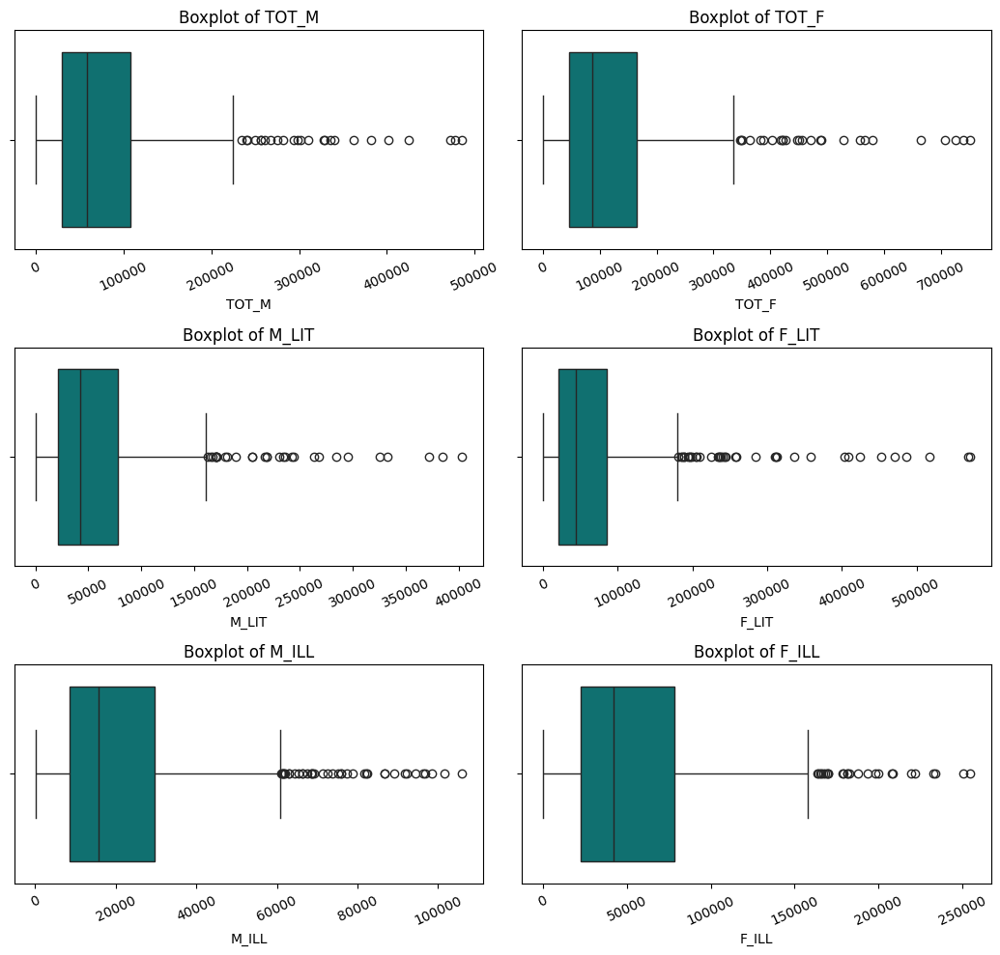

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10.5, 10));

# Check for outliers in numerical columns
for i, col in enumerate(numerical_cols):
    sns.boxplot(df_eda[col],ax=axes[i//2, i%2],orient='h', color='teal');
    axes[i//2, i%2].set_title(f'Boxplot of {col}');
    axes[i//2, i%2].tick_params(axis='x', rotation=25)

plt.tight_layout();

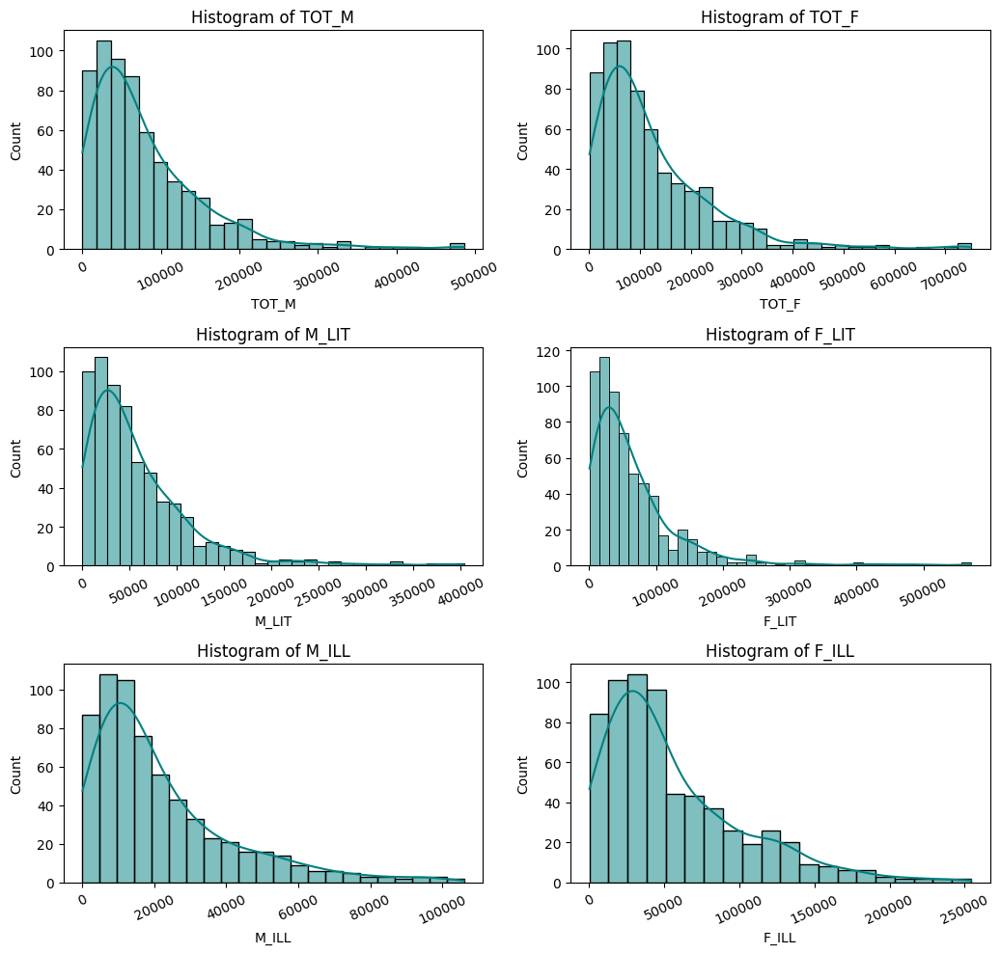

In [ ]:
# Histograms
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10.5, 10));
for i, col in enumerate(numerical_cols):
    sns.histplot(df_eda[col],ax=axes[i//2, i%2],kde=True, color='teal');
    axes[i//2, i%2].set_title(f'Histogram of {col}');
    axes[i//2, i%2].tick_params(axis='x', rotation=25)

plt.tight_layout();

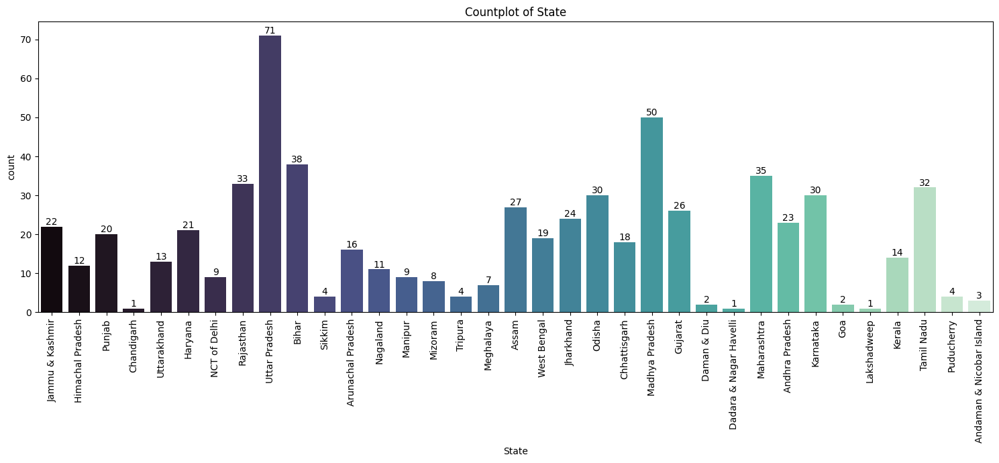

In [ ]:
# Setting up the subplots for one column
fig, ax = plt.subplots(figsize=(15, 7))

plt.title('Distribution of State Column', fontsize=20, y=1)

# Check for distribution of the categorical column
sns.countplot(data=df_eda, x='State', ax=ax, palette='mako')
ax.set_title(f'Countplot of State')
ax.tick_params(axis='x', rotation=90)

# Adding annotations
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

#### From the Univariate analysis,
##### We can see outliers in the numerical columns from the boxplot
##### The selected variables are Right Skewed
##### From the countplot, Uttar Pradesh has high frequency of 71 and Chandigarh, Dadar & Lakshadweep has low frequency of 1

### Bivariate Analysis

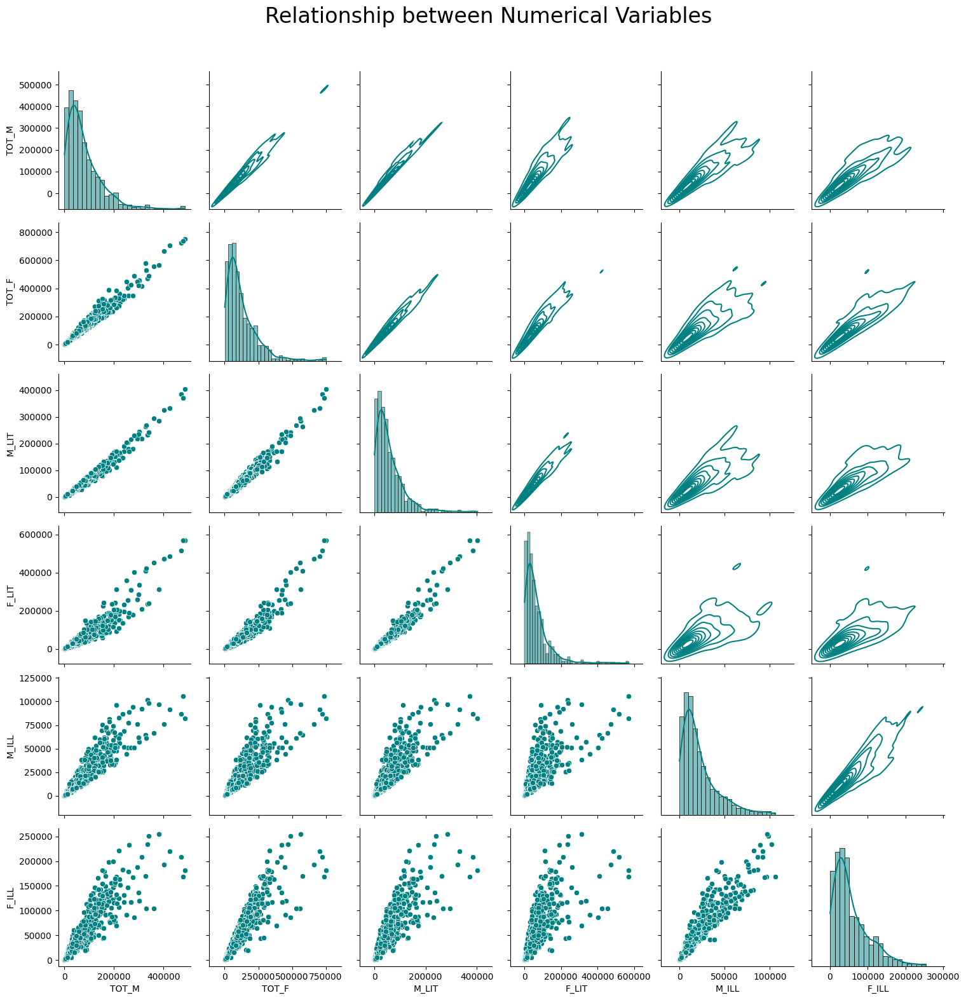

In [ ]:
g = sns.PairGrid(df_eda)
g.map_upper(sns.kdeplot, color='teal')
g.map_lower(sns.scatterplot, color='teal')
g.map_diag(sns.histplot, color='teal', kde=True)
g.fig.suptitle('Relationship between Numerical Variables', fontsize=24, y=1.05);

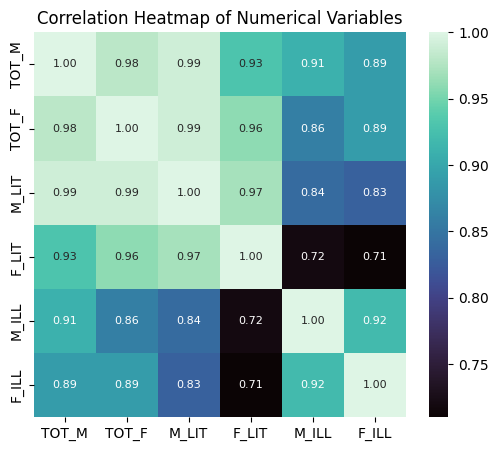

In [ ]:
# Correlation matrix for numerical variables
corr_matrix = np.round(df_eda[numerical_cols].corr(),2)
plt.figure(figsize=(6, 5));
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='mako',annot_kws={"size": 8});
plt.title('Correlation Heatmap of Numerical Variables');

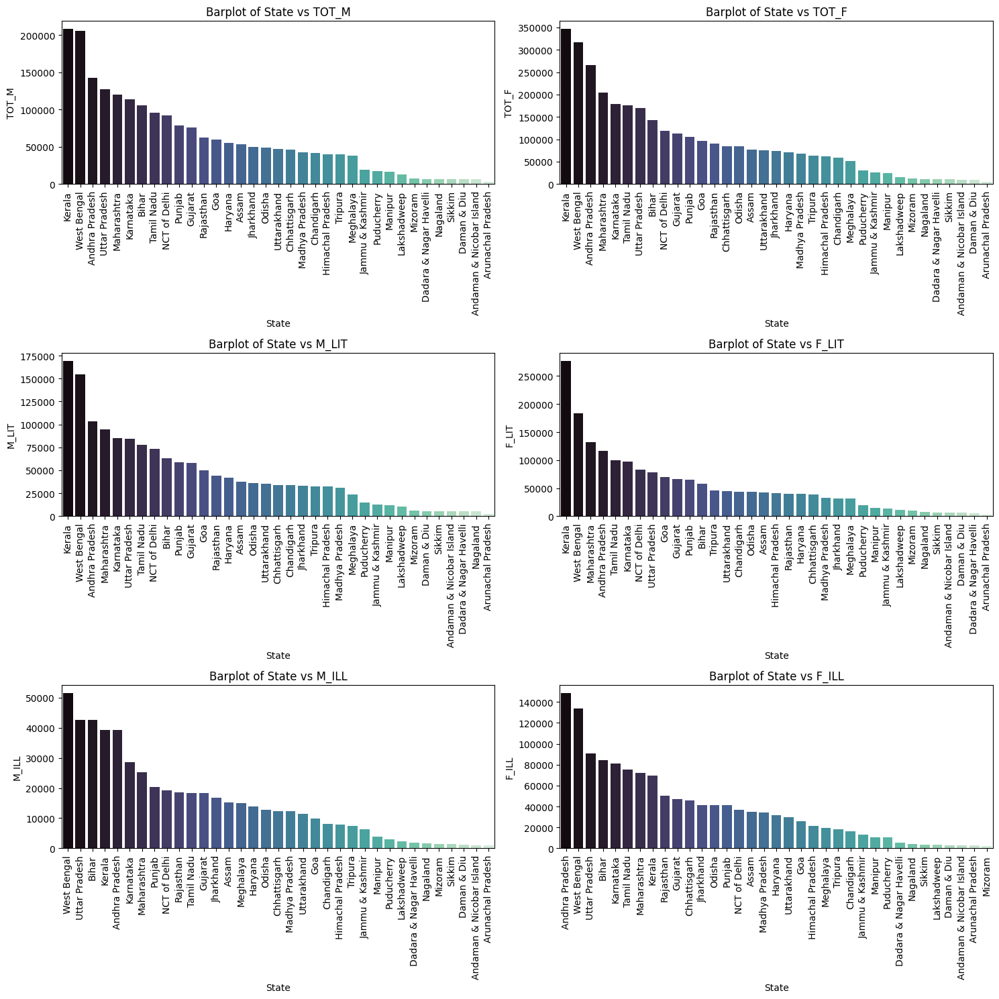

In [ ]:
# Setting up the subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

# Iterate through numerical columns
for i, col in enumerate(numerical_cols):
    # Calculating the mean values for each state and sorting them in descending order
    mean_values = df_eda.groupby('State')[col].mean().sort_values(ascending=False)
    sns.barplot(x=mean_values.index, y=mean_values.values, ax=axes[i//2, i%2], ci=None, palette='mako')
    axes[i//2, i%2].set_title(f'Barplot of State vs {col}')
    axes[i//2, i%2].set_ylabel(col)  # Set y-label to the column name
    axes[i//2, i%2].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

#### From the Bivariate analysis,
##### The selected numerical variables are positively correlated
##### Kerala has the highest Male, Female, Literate Male and Literate Female Population
##### Arunachal has the lowest Male, Female, Literate Male and Literate Female Population
##### Westbengal has the highest Illiterate Male population whereas Arunachal has the lowest illiterate male population
##### Andhra Pradesh has the highest Illiterate Female population whereas Mizoram has the lowest illiterate female population

##### Please note that the above high and low values entirely depends on the male & female population of the state. High values doesn't necessarily mean high as the corresponding state has high population. Percentage value from the State's population decides the high or low values

### Problem 2 - Data Preprocessing
- Check for and treat (if needed) missing values - Check for and treat (if needed) data irregularities - Scale the Data using the z-score method - Visualize the data before and after scaling and comment on the impact on outliers

#### There are no missing values in the dataset.
#### There are no data irregularities. We have 2 categorical columns and others are numerical columns

### Scaling the data

In [ ]:
df2.head()

,State Code,Dist.Code,State,Area Name,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,1,1,Jammu & Kashmir,Kupwara,7707,23388,29796,5862,6196,3,...,1150,749,180,237,680,252,32,46,258,214
1,1,2,Jammu & Kashmir,Badgam,6218,19585,23102,4482,3733,7,...,525,715,123,229,186,148,76,178,140,160
2,1,3,Jammu & Kashmir,Leh(Ladakh),4452,6546,10964,1082,1018,3,...,114,188,44,89,3,34,0,4,67,61
3,1,4,Jammu & Kashmir,Kargil,1320,2784,4206,563,677,0,...,194,247,61,128,13,50,4,10,116,59
4,1,5,Jammu & Kashmir,Punch,11654,20591,29981,5157,4587,20,...,874,1928,465,1043,205,302,24,105,180,478


##### We will drop the columns which are not suitable for the PCA

In [ ]:
df2.columns

Index(['State Code', 'Dist.Code', 'State', 'Area Name', 'No_HH', 'TOT_M',
       'TOT_F', 'M_06', 'F_06', 'M_SC', 'F_SC', 'M_ST', 'F_ST', 'M_LIT',
       'F_LIT', 'M_ILL', 'F_ILL', 'TOT_WORK_M', 'TOT_WORK_F', 'MAINWORK_M',
       'MAINWORK_F', 'MAIN_CL_M', 'MAIN_CL_F', 'MAIN_AL_M', 'MAIN_AL_F',
       'MAIN_HH_M', 'MAIN_HH_F', 'MAIN_OT_M', 'MAIN_OT_F', 'MARGWORK_M',
       'MARGWORK_F', 'MARG_CL_M', 'MARG_CL_F', 'MARG_AL_M', 'MARG_AL_F',
       'MARG_HH_M', 'MARG_HH_F', 'MARG_OT_M', 'MARG_OT_F', 'MARGWORK_3_6_M',
       'MARGWORK_3_6_F', 'MARG_CL_3_6_M', 'MARG_CL_3_6_F', 'MARG_AL_3_6_M',
       'MARG_AL_3_6_F', 'MARG_HH_3_6_M', 'MARG_HH_3_6_F', 'MARG_OT_3_6_M',
       'MARG_OT_3_6_F', 'MARGWORK_0_3_M', 'MARGWORK_0_3_F', 'MARG_CL_0_3_M',
       'MARG_CL_0_3_F', 'MARG_AL_0_3_M', 'MARG_AL_0_3_F', 'MARG_HH_0_3_M',
       'MARG_HH_0_3_F', 'MARG_OT_0_3_M', 'MARG_OT_0_3_F', 'NON_WORK_M',
       'NON_WORK_F'],
      dtype='object')

In [ ]:
df_pca = df2.drop(['State Code', 'Dist.Code', 'State', 'Area Name'], axis = 1)
df_pca.head()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,7707,23388,29796,5862,6196,3,0,1999,2598,13381,...,1150,749,180,237,680,252,32,46,258,214
1,6218,19585,23102,4482,3733,7,6,427,517,10513,...,525,715,123,229,186,148,76,178,140,160
2,4452,6546,10964,1082,1018,3,6,5806,9723,4534,...,114,188,44,89,3,34,0,4,67,61
3,1320,2784,4206,563,677,0,0,2666,3968,1842,...,194,247,61,128,13,50,4,10,116,59
4,11654,20591,29981,5157,4587,20,33,7670,10843,13243,...,874,1928,465,1043,205,302,24,105,180,478


In [ ]:
#Check the number of features
len(df_pca.columns)

57

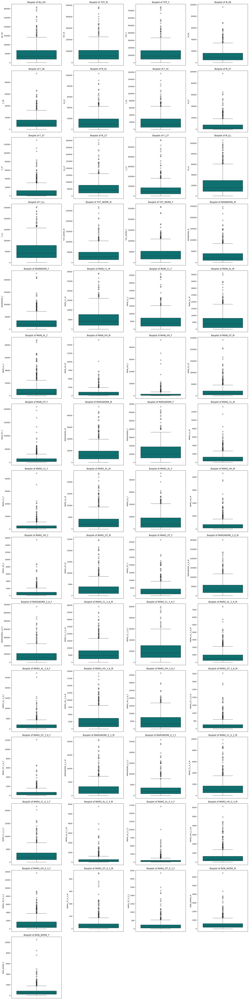

In [ ]:
#Check for presence of outliers in each feature

plt.figure(figsize=(20, 80))
feature_list = df_pca.columns

# Determine the layout of the subplots
rows = 15  # Total number of rows (adjust based on the number of features)
cols = 4   # Number of columns per row

for i in range(len(feature_list)):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(y=df_pca[feature_list[i]], data=df_pca, color='teal')
    plt.title('Boxplot of {}'.format(feature_list[i]))

plt.tight_layout()
plt.show()

##### We are not going to treat outliers in this case, as these are True values and we cannot treat them as outliers. But keep in mind that PCA is sensitive to outliers

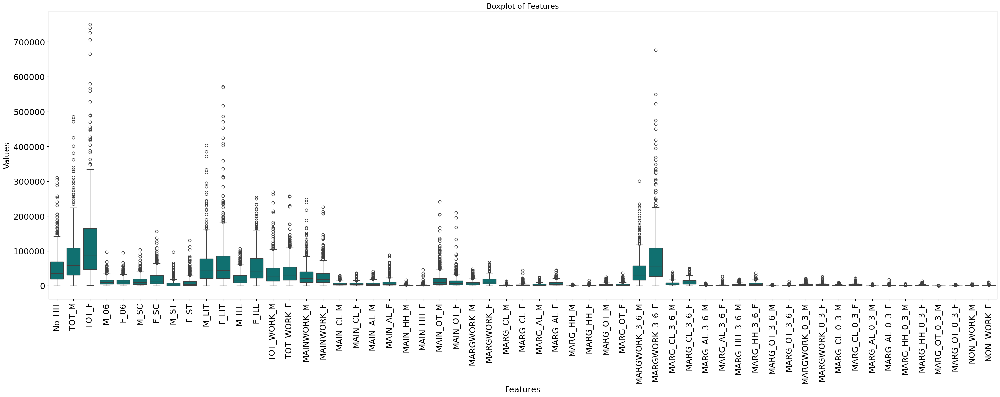

In [ ]:
plt.figure(figsize=(30, 12))
sns.boxplot(data=df_pca, color='teal')
plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=18)
plt.title('Boxplot of Features', fontsize=16)
plt.xlabel('Features', fontsize=18)
plt.ylabel('Values', fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
scaler = StandardScaler()
df2_scaled = scaler.fit_transform(df_pca)
df2_scaled = pd.DataFrame(df2_scaled, columns=df_pca.columns)

In [ ]:
df2_scaled.head()

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
0,-0.904738,-0.771236,-0.815563,-0.561012,-0.507738,-0.958575,-0.957049,-0.423306,-0.476423,-0.798097,...,-0.163229,-0.720610,-0.156494,-0.287524,0.156577,-0.657412,-0.365258,-0.499977,-0.413053,-0.539614
1,-0.935695,-0.823100,-0.874534,-0.681096,-0.725367,-0.958297,-0.956772,-0.582014,-0.607607,-0.849434,...,-0.583103,-0.732811,-0.282327,-0.294688,-0.491731,-0.723062,0.042855,-0.073481,-0.606455,-0.598988
2,-0.972412,-1.000919,-0.981466,-0.976956,-0.965262,-0.958575,-0.956772,-0.038951,-0.027273,-0.956457,...,-0.859212,-0.921931,-0.456727,-0.420050,-0.731894,-0.795026,-0.662068,-0.635680,-0.726103,-0.707839
3,-1.037530,-1.052224,-1.041001,-1.022118,-0.995393,-0.958783,-0.957049,-0.355965,-0.390060,-1.004643,...,-0.805468,-0.900758,-0.419198,-0.385127,-0.718770,-0.784926,-0.624966,-0.616294,-0.645791,-0.710038
4,-0.822676,-0.809381,-0.813933,-0.622359,-0.649908,-0.957395,-0.955529,0.149238,0.043330,-0.800568,...,-0.348645,-0.297513,0.472670,0.434200,-0.466796,-0.625849,-0.439461,-0.309346,-0.540895,-0.249344


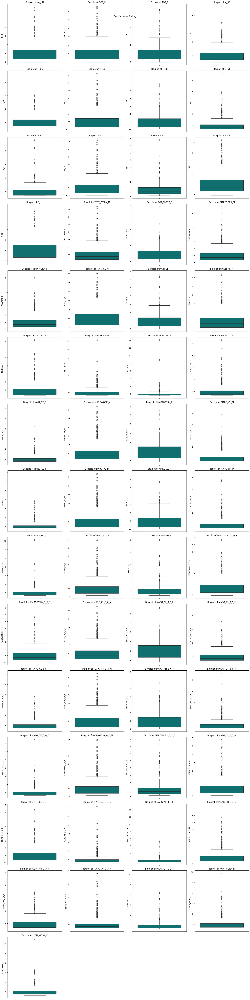

In [ ]:
#Check for presence of outliers after scaling

plt.figure(figsize=(20, 80))
feature_list = df2_scaled.columns

# Determine the layout of the subplots
rows = 15  # Total number of rows (adjust based on the number of features)
cols = 4   # Number of columns per row

for i in range(len(feature_list)):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(y=df2_scaled[feature_list[i]], data=df2_scaled, color='teal')
    plt.title('Boxplot of {}'.format(feature_list[i]))

plt.suptitle('Box Plot after Scaling');
plt.tight_layout()
plt.show()

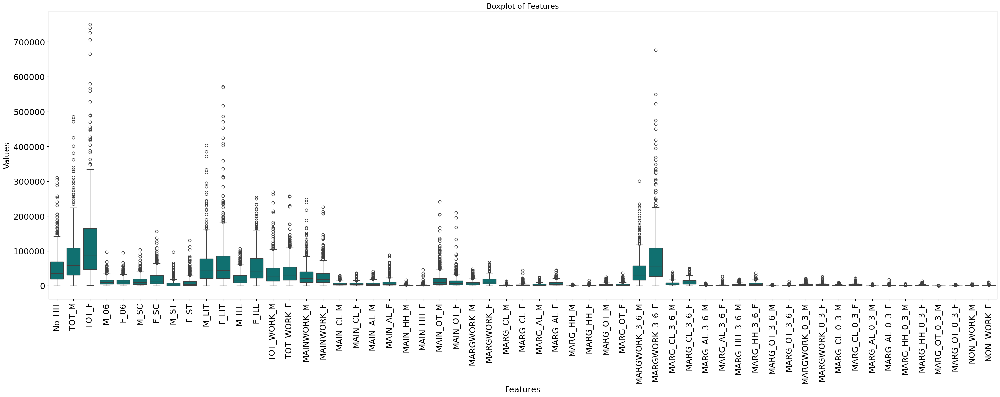

In [ ]:
plt.figure(figsize=(30, 12))
sns.boxplot(data=df_pca, color='teal')
plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=18)
plt.title('Boxplot of Features', fontsize=16)
plt.xlabel('Features', fontsize=18)
plt.ylabel('Values', fontsize=18)
plt.tight_layout()
plt.show()

#### From the above, we can see that there is no effect of scaling on outliers

### Problem 2 - PCA
- Create the covariance matrix - Get eigen values and eigen vectors - Identify the optimum number of PCs - Show Scree plot - Compare PCs with Actual Columns and identify which is explaining most variance - Write inferences about all the PCs in terms of actual variables - Write linear equation for first PC Note: For the scope of this project, take at least 90% explained variance


### Statistical tests to be done before PCA

#### Bartletts Test of Sphericity
Bartlett's test of sphericity tests the hypothesis that the variables are uncorrelated in the population.

- H0: All variables in the data are uncorrelated
- Ha: At least one pair of variables in the data are correlated

If the null hypothesis cannot be rejected, then PCA is not advisable.

If the p-value is small, then we can reject the null hypothesis and agree that there is atleast one pair of vairbales in the data wihich are correlated hence PCA is recommended.

In [ ]:
#Confirm the statistical significance of correlations
#H0: Correlations are not significant, H1: There are significant correlations
#Reject H0 if p-value < 0.05
!pip install factor_analyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(df2_scaled)
p_value

0.0

#### KMO Test

The Kaiser-Meyer-Olkin (KMO) - measure of sampling adequacy (MSA) is an index used to examine how appropriate PCA is.

Generally, if MSA is less than 0.5, PCA is not recommended, since no reduction is expected. On the other hand, MSA > 0.7 is expected to provide a considerable reduction is the dimension and extraction of meaningful components.

In [ ]:
#Confirm the adequacy of sample size.
#Note: Above 0.7 is good, below 0.5 is not acceptable
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(df2_scaled)
kmo_model

0.8039889932781807

## Principal Component Analysis

In [ ]:
#Defining the number of principal components to generate
n=df2_scaled.shape[1]

#Finding principal components for the data
pca = PCA(n_components=n, random_state=1)
pca_transformed = pd.DataFrame(pca.fit_transform(df2_scaled))

In [ ]:
# Covariance Matrix
# Method 1:-
cov_matrix = pd.DataFrame(np.round(pca.get_covariance(),2),columns=df2_scaled.columns,index=df2_scaled.columns)
cov_matrix

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
No_HH,1.00,0.92,0.97,0.80,0.80,0.78,0.83,0.15,0.17,0.93,...,0.56,0.56,0.07,0.05,0.37,0.42,0.49,0.54,0.76,0.74
TOT_M,0.92,1.00,0.98,0.95,0.95,0.84,0.83,0.09,0.09,0.99,...,0.70,0.60,0.17,0.12,0.50,0.44,0.65,0.59,0.85,0.72
TOT_F,0.97,0.98,1.00,0.91,0.91,0.82,0.83,0.12,0.13,0.99,...,0.66,0.60,0.14,0.10,0.45,0.44,0.59,0.57,0.83,0.75
M_06,0.80,0.95,0.91,1.00,1.00,0.78,0.75,0.06,0.04,0.91,...,0.76,0.65,0.27,0.20,0.60,0.51,0.69,0.57,0.79,0.65
F_06,0.80,0.95,0.91,1.00,1.00,0.77,0.74,0.07,0.05,0.91,...,0.76,0.65,0.26,0.19,0.61,0.52,0.70,0.58,0.78,0.65
M_SC,0.78,0.84,0.82,0.78,0.77,1.00,0.99,-0.05,-0.05,0.82,...,0.67,0.57,0.18,0.13,0.52,0.46,0.67,0.59,0.74,0.58
F_SC,0.83,0.83,0.83,0.75,0.74,0.99,1.00,-0.01,-0.01,0.82,...,0.65,0.59,0.16,0.12,0.51,0.49,0.63,0.59,0.72,0.60
M_ST,0.15,0.09,0.12,0.06,0.07,-0.05,-0.01,1.00,0.99,0.09,...,0.12,0.20,0.03,0.01,0.13,0.24,-0.01,0.09,0.12,0.15
F_ST,0.17,0.09,0.13,0.04,0.05,-0.05,-0.01,0.99,1.00,0.09,...,0.12,0.22,0.02,0.00,0.14,0.27,-0.01,0.10,0.11,0.15
M_LIT,0.93,0.99,0.99,0.91,0.91,0.82,0.82,0.09,0.09,1.00,...,0.65,0.56,0.14,0.10,0.42,0.38,0.60,0.55,0.85,0.74


In [ ]:
# Method 2:-
cov_matrix2 = df2_scaled.cov()
cov_matrix2

,No_HH,TOT_M,TOT_F,M_06,F_06,M_SC,F_SC,M_ST,F_ST,M_LIT,...,MARG_CL_0_3_M,MARG_CL_0_3_F,MARG_AL_0_3_M,MARG_AL_0_3_F,MARG_HH_0_3_M,MARG_HH_0_3_F,MARG_OT_0_3_M,MARG_OT_0_3_F,NON_WORK_M,NON_WORK_F
No_HH,1.001565,0.917604,0.972109,0.798807,0.797619,0.776522,0.825137,0.149861,0.165361,0.933397,...,0.557813,0.556412,0.067531,0.046200,0.369168,0.418100,0.487508,0.537694,0.763577,0.736844
TOT_M,0.917604,1.001565,0.984178,0.952313,0.949275,0.841240,0.827592,0.091565,0.086315,0.990860,...,0.699403,0.596628,0.167666,0.115761,0.496704,0.441049,0.652624,0.589101,0.846218,0.717182
TOT_F,0.972109,0.984178,1.001565,0.909396,0.907975,0.818238,0.834059,0.123819,0.128848,0.986983,...,0.656373,0.599888,0.138980,0.099593,0.451717,0.443825,0.594735,0.572748,0.828949,0.747751
M_06,0.798807,0.952313,0.909396,1.001565,0.999713,0.782342,0.748700,0.055361,0.044017,0.914186,...,0.761800,0.648011,0.267091,0.198649,0.602031,0.514860,0.691682,0.565914,0.786189,0.652162
F_06,0.797619,0.949275,0.907975,0.999713,1.001565,0.774345,0.742846,0.065240,0.054748,0.909062,...,0.764809,0.650851,0.259074,0.189865,0.612525,0.524089,0.699729,0.575077,0.784954,0.652458
M_SC,0.776522,0.841240,0.818238,0.782342,0.774345,1.001565,0.986612,-0.045738,-0.047900,0.819765,...,0.674687,0.570470,0.184620,0.129953,0.524269,0.462621,0.665958,0.592362,0.736550,0.580927
F_SC,0.825137,0.827592,0.834059,0.748700,0.742846,0.986612,1.001565,-0.014144,-0.009204,0.815424,...,0.651473,0.586607,0.163683,0.116410,0.508801,0.489422,0.629453,0.590268,0.721226,0.601028
M_ST,0.149861,0.091565,0.123819,0.055361,0.065240,-0.045738,-0.014144,1.001565,0.989593,0.090682,...,0.123160,0.196878,0.027262,0.007088,0.126534,0.239186,-0.005491,0.090264,0.123178,0.147184
F_ST,0.165361,0.086315,0.128848,0.044017,0.054748,-0.047900,-0.009204,0.989593,1.001565,0.087512,...,0.121601,0.217081,0.017232,0.002560,0.136610,0.273735,-0.005889,0.100140,0.114309,0.151105
M_LIT,0.933397,0.990860,0.986983,0.914186,0.909062,0.819765,0.815424,0.090682,0.087512,1.001565,...,0.653528,0.560942,0.144292,0.101514,0.422422,0.382324,0.601059,0.553235,0.853533,0.739827


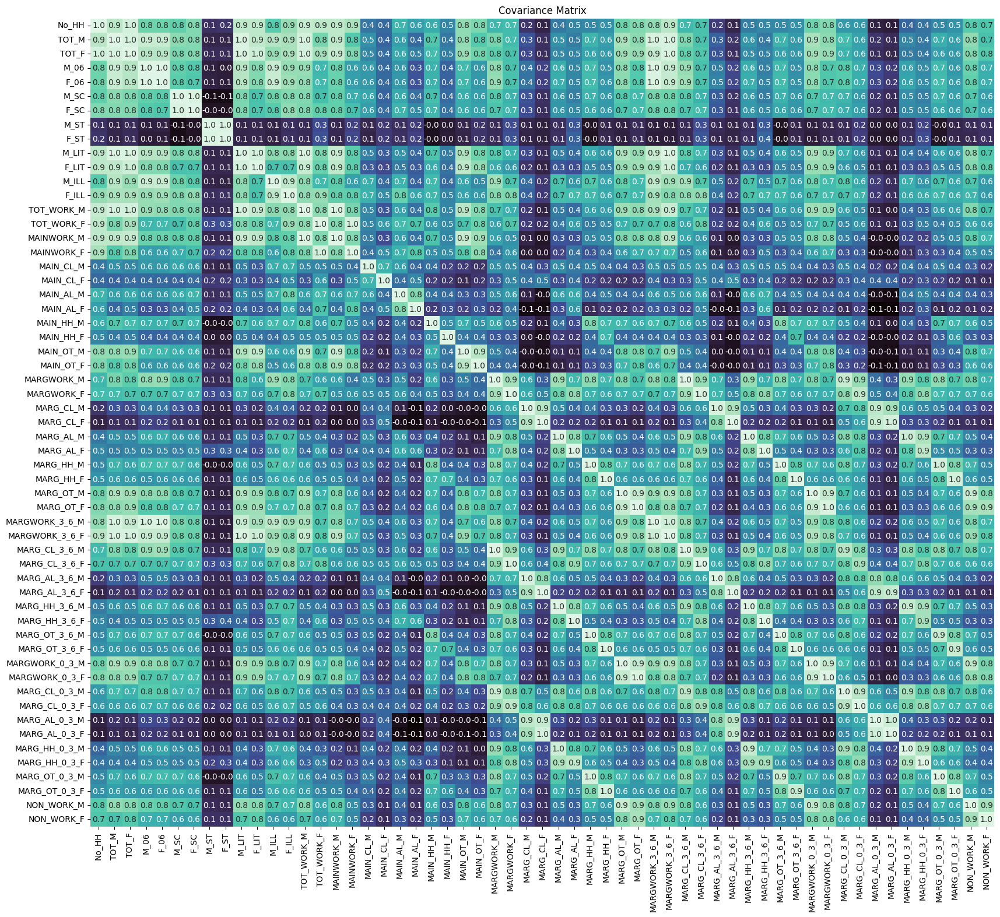

In [ ]:
plt.figure(figsize=(20, 18))
sns.heatmap(cov_matrix, annot=True, cmap='mako', fmt=".1f", annot_kws={"size": 10}, cbar=False)
plt.title('Covariance Matrix')
plt.show()

In [ ]:
#Extract eigen vectors
np.round(pca.components_,2)

array([[ 0.16,  0.17,  0.17, ...,  0.13,  0.15,  0.13],
       [-0.13, -0.09, -0.1 , ...,  0.05, -0.07, -0.07],
       [-0.  ,  0.06,  0.04, ..., -0.08,  0.11,  0.1 ],
       ...,
       [ 0.  ,  0.38,  0.15, ...,  0.03, -0.08, -0.03],
       [-0.  ,  0.24,  0.09, ..., -0.03, -0.02,  0.04],
       [-0.  , -0.09, -0.01, ...,  0.01, -0.01, -0.  ]])

In [ ]:
#Check the eigen values
#Note: This is always returned in descending order
pca.explained_variance_

array([3.18135647e+01, 7.86942415e+00, 4.15340812e+00, 3.66879058e+00,
       2.20652588e+00, 1.93827502e+00, 1.17617374e+00, 7.51159086e-01,
       6.17053743e-01, 5.28300887e-01, 4.29831189e-01, 3.53440201e-01,
       2.96163013e-01, 2.81275560e-01, 1.92158325e-01, 1.36267920e-01,
       1.13389199e-01, 1.06303946e-01, 9.72885376e-02, 8.01062194e-02,
       5.76089954e-02, 4.43955966e-02, 3.78910846e-02, 2.96360194e-02,
       2.70797618e-02, 2.34458139e-02, 1.45111511e-02, 1.09852268e-02,
       9.31507853e-03, 8.13540203e-03, 7.89250253e-03, 5.02601514e-03,
       2.59771182e-03, 1.06789820e-03, 7.13559124e-04, 2.47799812e-31,
       2.47799812e-31, 2.47799812e-31, 2.47799812e-31, 2.47799812e-31,
       2.47799812e-31, 2.47799812e-31, 2.47799812e-31, 2.47799812e-31,
       2.47799812e-31, 2.47799812e-31, 2.47799812e-31, 2.47799812e-31,
       2.47799812e-31, 2.47799812e-31, 2.47799812e-31, 2.47799812e-31,
       2.47799812e-31, 2.47799812e-31, 2.47799812e-31, 2.47799812e-31,
      

In [ ]:
#Check the explained variance for each PC
#Note: Explained variance = (eigen value of each PC)/(sum of eigen values of all PCs)
#The percentage of variance explained by each principal component
exp_var = pca.explained_variance_ratio_

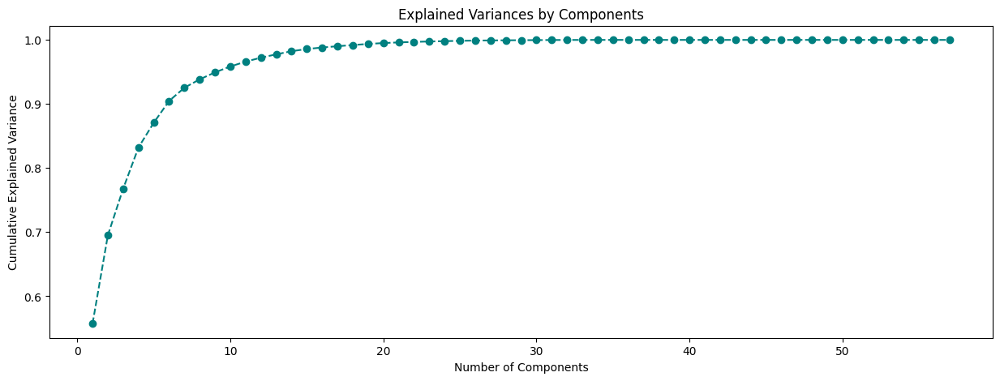

In [ ]:
# visualize the explained variance by individual components
plt.figure(figsize = (15,5))
plt.plot(range(1,58), exp_var.cumsum(), marker = 'o', linestyle = '--',color='teal')
plt.title("Explained Variances by Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.show()

In [ ]:
cum_var_exp = np.cumsum(exp_var)
cum_var_exp

array([0.55726063, 0.69510499, 0.76785794, 0.83212212, 0.87077261,
       0.9047243 , 0.92532669, 0.93848433, 0.94929292, 0.95854687,
       0.96607599, 0.97226701, 0.97745473, 0.98238168, 0.98574761,
       0.98813454, 0.99012071, 0.99198278, 0.99368693, 0.99509011,
       0.99609921, 0.99687687, 0.99754058, 0.9980597 , 0.99853404,
       0.99894473, 0.99919891, 0.99939134, 0.9995545 , 0.99969701,
       0.99983525, 0.99992329, 0.9999688 , 0.9999875 , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        ])

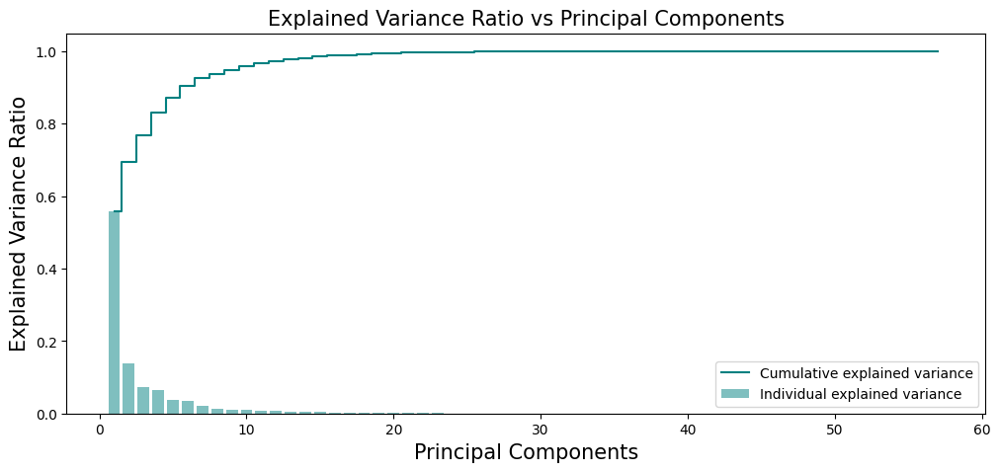

In [ ]:
# Ploting  -Option -2 Plot Cumulative explained variance and individual explained variance vs Principal Components
plt.figure(figsize=(12 ,5))
plt.bar(range(1, exp_var.size + 1), exp_var, alpha = 0.5, align = 'center', label = 'Individual explained variance', color='teal')
plt.step(range(1, exp_var.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance',color='teal')
plt.ylabel('Explained Variance Ratio',fontsize=15)
plt.xlabel('Principal Components',fontsize=15)
plt.title('Explained Variance Ratio vs Principal Components',fontsize=15)
plt.legend(loc = 'best')
#plt.grid()
plt.show()

In [ ]:
# find the least number of components that can explain more than 90% variance
sum = 0
for ix, i in enumerate(exp_var):
  sum = sum + i
  if(sum>0.90):
    print("Number of PCs that explain at least 90% variance: ", ix+1)
    break

Number of PCs that explain at least 90% variance:  6


In [ ]:
#Create a dataframe containing the loadings or coefficients of all PCs
df_extracted_loadings = pd.DataFrame(pca.components_.T,
                                     columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
                                                'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19', 'PC20',
                                                'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26', 'PC27', 'PC28', 'PC29', 'PC30',
                                                'PC31', 'PC32', 'PC33', 'PC34', 'PC35', 'PC36', 'PC37', 'PC38', 'PC39', 'PC40',
                                                'PC41', 'PC42', 'PC43', 'PC44', 'PC45', 'PC46', 'PC47', 'PC48', 'PC49', 'PC50',
                                                'PC51', 'PC52', 'PC53', 'PC54', 'PC55', 'PC56', 'PC57'],
                                    index = df2_scaled.columns)

#Choose the PCs basis cumulative explained variance
df_selected = df_extracted_loadings[['PC1','PC2', 'PC3', 'PC4', 'PC5', 'PC6']]

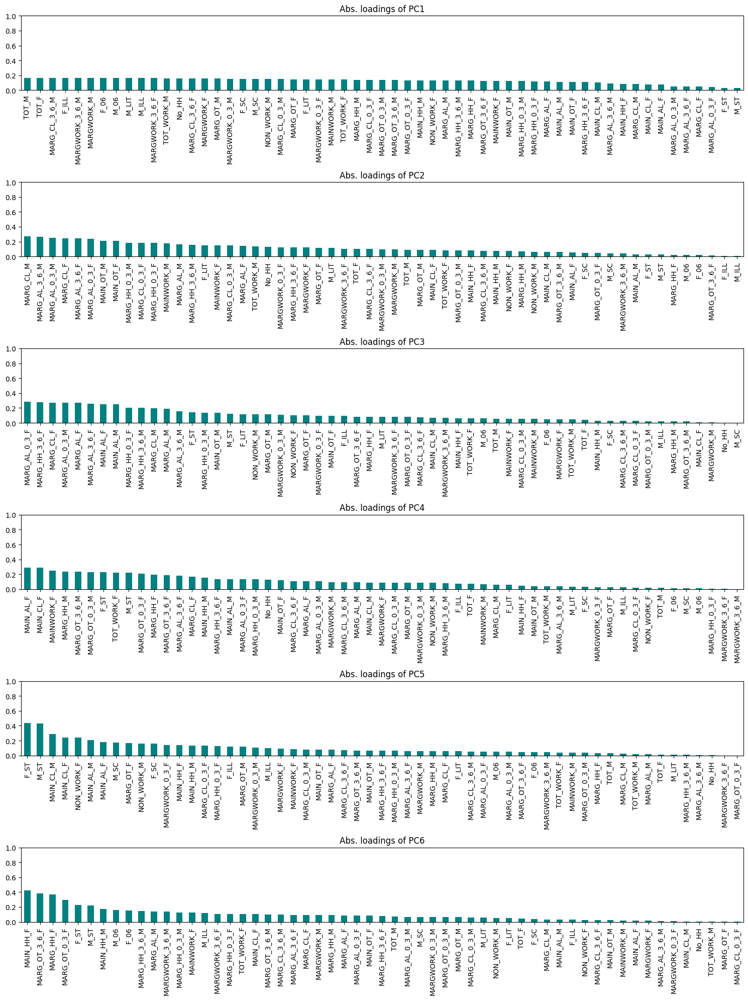

In [ ]:
#Check as to how the original features matter to each PC
#Note: Here we are only considering the absolute values
plt.figure(figsize = (15,20))
for i in range(len(df_selected.columns)):
    plt.subplot(6,1,i+1)
    abs(df_selected[df_selected.columns[i]]).T.sort_values(ascending = False).plot.bar(color='teal')
    plt.yticks(np.arange(0,1.2,.2))
    plt.title('Abs. loadings of {}'.format(df_selected.columns[i]))
    plt.tight_layout()

In [ ]:
# Apply PCA for the number of decided components to get the loadings and component output
# Using scikit learn PCA here. It does all the above steps and maps data to PCA dimensions in one shot

# NOTE - we are generating only 6 PCA dimensions (dimensionality reduction from 57 to 6)
pca = PCA(n_components=6, random_state=123)
df_pca = pca.fit_transform(df2_scaled)

In [ ]:
#Just create a dataframe out of fit_transformed scaled data above
#Note: Notice the output of cell 34 and the first row of the dataframe below
pca_final_df = pd.DataFrame(df_pca,columns=df_selected.columns)
pca_final_df.head(10)

,PC1,PC2,PC3,PC4,PC5,PC6
0,-4.617263,0.138116,0.328545,1.543697,0.353736,-0.420948
1,-4.771662,-0.105865,0.244449,1.963215,-0.153884,0.417308
2,-5.964836,-0.294347,0.367394,0.619543,0.478199,0.276581
3,-6.280796,-0.500384,0.212701,1.074515,0.300799,0.051157
4,-4.478566,0.894154,1.078277,0.535557,0.804065,0.341678
5,-3.319963,2.823865,3.058460,-0.447904,0.742445,0.634676
6,-5.021393,-0.346359,0.650378,0.981072,-0.059778,-0.246957
7,-4.608709,0.022370,0.398755,1.576995,0.171316,-0.139444
8,-5.186703,-0.059097,0.184397,1.735440,0.169174,0.455039
9,-4.226190,-1.335080,0.697838,1.470509,0.269146,-0.002576


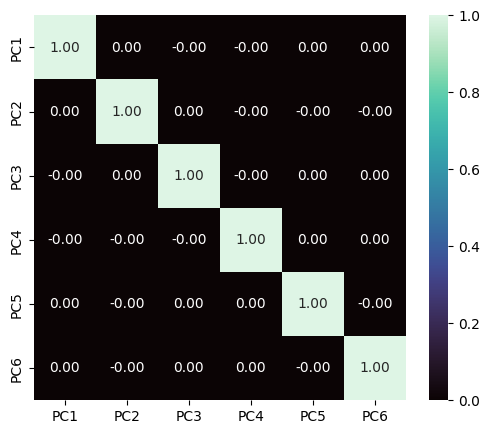

In [ ]:
#Check for presence of correlations among teh PCs
plt.figure(figsize = (6,5))
sns.heatmap(pca_final_df.corr(), annot=True,fmt='.2f', cmap='mako');

#### Linear equation

In [ ]:
## print('The Linear eq of 1st component: ')
for i in range(0,df2_scaled.shape[1]):
    print('{} * {}'.format(np.round(pca.components_[0][i],2),df2_scaled.columns[i]),end=' (+) ')

0.16 * No_HH (+) 0.17 * TOT_M (+) 0.17 * TOT_F (+) 0.16 * M_06 (+) 0.16 * F_06 (+) 0.15 * M_SC (+) 0.15 * F_SC (+) 0.03 * M_ST (+) 0.03 * F_ST (+) 0.16 * M_LIT (+) 0.15 * F_LIT (+) 0.16 * M_ILL (+) 0.17 * F_ILL (+) 0.16 * TOT_WORK_M (+) 0.15 * TOT_WORK_F (+) 0.15 * MAINWORK_M (+) 0.12 * MAINWORK_F (+) 0.1 * MAIN_CL_M (+) 0.07 * MAIN_CL_F (+) 0.11 * MAIN_AL_M (+) 0.07 * MAIN_AL_F (+) 0.13 * MAIN_HH_M (+) 0.08 * MAIN_HH_F (+) 0.12 * MAIN_OT_M (+) 0.11 * MAIN_OT_F (+) 0.16 * MARGWORK_M (+) 0.16 * MARGWORK_F (+) 0.08 * MARG_CL_M (+) 0.05 * MARG_CL_F (+) 0.13 * MARG_AL_M (+) 0.11 * MARG_AL_F (+) 0.14 * MARG_HH_M (+) 0.13 * MARG_HH_F (+) 0.16 * MARG_OT_M (+) 0.15 * MARG_OT_F (+) 0.16 * MARGWORK_3_6_M (+) 0.16 * MARGWORK_3_6_F (+) 0.17 * MARG_CL_3_6_M (+) 0.16 * MARG_CL_3_6_F (+) 0.09 * MARG_AL_3_6_M (+) 0.05 * MARG_AL_3_6_F (+) 0.13 * MARG_HH_3_6_M (+) 0.11 * MARG_HH_3_6_F (+) 0.14 * MARG_OT_3_6_M (+) 0.12 * MARG_OT_3_6_F (+) 0.15 * MARGWORK_0_3_M (+) 0.15 * MARGWORK_0_3_F (+) 0.15 * MARG_CL

### We can also visualize the data in 2 dimensions using first two principal components

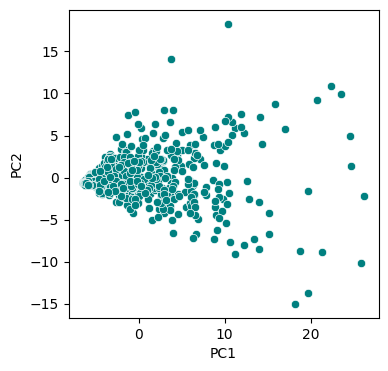

In [ ]:
plt.figure(figsize = (4,4))
sns.scatterplot(x=pca_final_df['PC1'],y=pca_final_df['PC2'], color='teal')
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

# Thank You